

##  Overview
This notebook validates machine learning paleotopography predictions against independent geochemical proxies by:
1. Loading geochemical paleoelevation estimates (Liu et al., 2023)
2. Reconstructing sample locations through geological time
3. Comparing with predicted topography at same locations/times
4. Computing spatial and temporal error statistics
5. Creating regional case studies (e.g., East Asian Cordillera)
6. Analyzing zircon age distributions as proxy for magmatic/orogenic activity

**Required time**: 10-20 mins depending on dataset size and reconstruction range.

---

## Geochemical Paleoelevation Methods

### Liu et al. (2023) Approach:

**Principle**: Trace element ratios in magmatic rocks vary systematically with crustal thickness and elevation.

#### Key Proxies (39 total):
- **REE Ratios**: La/Yb, Ce/Yb, Nd/Yb (reflect garnet fractionation)
- **HFSE Ratios**: Nb/Y, Zr/Ti (sensitive to crustal thickness)
- **Major Elements**: MnO, K₂O, CaO (weathering/alteration indicators)
- **Compatible Elements**: Ni/Sc, Cr/V (mantle source signals)

#### Calibration:
- Trained on modern arc samples with known elevation
#### Uncertainty:
- **Typical Error**: ±500-1500 m (1σ)
- **Sources**: Analytical uncertainty, alteration, source heterogeneity
- **Reported as**: Median ± Std across 39 proxies

---

## Workflow Overview

### Step 1: Load Geochemical Data
```python
paleoelevations_ld = pd.read_csv("paleoelevations_global.csv")
columns = ['la_yb_elevation', 'ce_yb_elevation', ...] # 39 proxies
paleoelevations_ld["Elevation (Median)"] = paleoelevations_ld[columns].median(axis=1)
paleoelevations_ld["Elevation (Std)"] = paleoelevations_ld[columns].std(axis=1)
```

**Quality Control**: 
- Keep only samples with >15 valid proxy measurements
- Filter unrealistic elevations (e.g., >8000 m)

### Step 2: Reconstruct Sample Locations
```python
gpts = gplately.Points(PK.model, lon, lat, time=0)
rlons, rlats = gpts.reconstruct(time=reconstruction_time)
```

**Challenge**: Samples collected at present-day locations but formed at paleo-locations.

### Step 3: Extract Predicted Topography
```python
db = xr.open_dataset(f"DL_Model_{reconstruction_time}.nc")
predicted_elevation = db['ElevationDL'].sel(lat=rlat, lon=rlon, method='nearest')
```

### Step 4: Compute Residuals
```python
error = geochemical_elevation - predicted_elevation
MAE = np.abs(error).mean()
```

---

## Gridding Geochemical Observations

### Why Grid?
- Visualization: Compare spatial patterns with model predictions
- Regional Statistics: Compute errors by geographic domain
- Temporal Evolution: Track how validation changes through time

### Process:
```python
da = df_to_NetCDF(
    x=data['Reconstructed Longitude'],
    y=data['Reconstructed Latitude'],
    z=data["Elevation (Median)"],
    statistic='median',  # Multiple samples per cell
    grid_resolution=0.1  # 0.1° (~11 km)
)
```

**Statistic Choice**:
- `median`: Robust to outliers
- `mean`: More samples contribute
- `count`: Track data density

### Post-Processing:
```python
da = post_process_grid(da, threshold_distance=5, n_neighbors=5)
```
- Fills gaps via KNN interpolation
- Only within 0.5° of actual data
- Prevents unrealistic extrapolation

---

## Temporal Binning Strategy

### Problem: Sparse temporal sampling
- Geochemical samples age certainity (5-10 Myrs)
### Solution: Age windowing
```python
time_window = 5 # Ma
samples = data[(data['age'] > recon_time - time_window) & 
               (data['age'] < recon_time + time_window)]
```

---

## 🎯 Error Metrics

### 1. Mean Absolute Error (MAE)
```python
MAE = np.abs(predicted - observed).mean()
```
- **Interpretation**: Average magnitude of error
- **Units**: Meters
- **Typical Value**: 500-1500 m for this application

### 2. Weighted Mean Error
```python
weighted_MAE = (counts * MAE_per_bin).sum() / counts.sum()
```
- Accounts for uneven sample distribution
- Prevents bias toward well-sampled times/regions

### 3. Error Threshold Analysis
```python
fraction_below_1000m = (error <= 1000).sum() / len(error)
```
- What % of predictions within ±1000 m?
- **Typical**: 60-80% within ±1000 m for active margins

### 4. Baseline Comparison
```python
baseline_error = abs(observed - modern_mean_elevation)
```
- Compare model to simple assumption (e.g., "topography = modern mean")
- Model should outperform naive baseline

---

## Regional Case Study: East Asian Cordillera

### Geological Context:
- **Location**: Eastern China, Korean Peninsula
- **Age Range**: 200-0 Ma
- **Tectonic Setting**: 
  - Paleo-Pacific subduction (Mesozoic)
  - Lithospheric thinning (Cenozoic)

### Data Sources:
1. **Geochemical**: Liu et al. (2023) - Arc magmatic rocks
2. **Zircons**: Global database of detrital/magmatic zircon ages
3. **Plate Reconstructions**: Merdith et al. (2021) 1 Ga model

### Subdomains:
```python
'South China': Yangtze craton region
'North China': North China craton region  
'COAB': Central Asian Orogenic Belt
```

---

## Zircon Age Distributions

### Why Zircons?
- **Robust Geochronometer**: U-Pb dating to high precision
- **Erosion Proxy**: Peak zircon ages = periods of intense magmatism/erosion
- **Provenance Tracer**: Detrital zircons record source region ages

### Kernel Density Estimation (KDE):
```python
kde = gaussian_kde(ages, bw_method=0.12)
density = kde(x_vals)
```

**Purpose**: Smooth age distribution to identify peaks (magmatic pulses).

### Bootstrap Confidence Intervals:
```python
for _ in range(1000):
    sample = np.random.choice(ages, size=5000, replace=True)
    bootstrap_kdes.append(kde(sample))

ci_68 = np.percentile(bootstrap_kdes, [16, 84], axis=0)
```

**Why Bootstrap?**
- Quantifies sampling uncertainty
- Avoids over-interpreting single peaks
- Standard practice in detrital zircon analysis

### Interpretation:
- **Igneous Zircons**: Direct magmatic ages (arc activity)
- **Sedimentary Zircons**: Erosion of older sources (mountain building)
- **Metamorphic Zircons**: Thermal events (collision/exhumation)

---

## Residual Analysis

### Temporal Evolution Plot:

**Components**:
1. **Raw Scatter**: Individual sample errors (points)
2. **Mean ± 1σ**: Smoothed trend with uncertainty band
3. **Baseline Error**: Horizontal line (e.g., ±732 m = modern mean)
4. **Sample Counts**: Bar chart showing data density

### Interpretation:
- **High MAE Period**: Model struggles (e.g., rapid topographic change)
- **Low MAE Period**: Model accurate (e.g., stable tectonics)
- **Increasing Uncertainty**: Older times have fewer constraints


---

## Spatial Error Mapping

### Global Mollweide/Robinson Projections:
```python
ax = fig.add_subplot(111, projection=ccrs.Robinson())
gdf.plot(ax=ax, column='Error', cmap='berlin', vmin=-4000, vmax=4000)
```

**Color Scheme**:
- **Blue**: Model under-predicts elevation (too low)
- **Red**: Model over-predicts elevation (too high)
- **White**: Good agreement (±500 m)

### Overlay Features:
- Plate boundaries (trenches, ridges)
- Reconstructed coastlines
- Subduction teeth

**Purpose**: Identify systematic spatial biases (e.g., all Andean samples under-predicted).

---

##  Animated Validation

### Time-Lapse Error Maps:
```python
for reconstruction_time in range(200, -1, -10):
    plot_error_map(reconstruction_time)
    save_frame()

create_gif(frames, output='geochemical_error.gif')
```

**Benefits**:
- Visualize how validation quality changes through time
- Spot emergence/closure of error hotspots
- Communicate results to non-specialists

---

##  Bootstrap KDE for Zircon Ages

### Purpose:
Quantify uncertainty in age distribution peaks.

### Method:
1. **Resample**: Draw 5000 ages with replacement from dataset
2. **Compute KDE**: Generate smooth density curve
3. **Repeat**: 1000 bootstrap iterations
4. **Statistics**: Compute percentiles (16th, 50th, 84th)

### Output:
- **Mean Density**: Average of all bootstrap KDEs
- **68% CI**: ±1σ confidence band (16th-84th percentile)
- **95% CI**: ±2σ confidence band (2.5th-97.5th percentile)

### Interpretation:
- **Narrow CI**: Peak is well-constrained (many samples)
- **Wide CI**: Peak is uncertain (few samples or noisy)

---

##  East Asia Paleo-Elevation Time Series

### Workflow:
```python
for reconstruction_time in range(200, 0, -1):
    # 1. Reconstruct subdomain polygons
    pygplates.reconstruct(subdomain_file, rotation_model, time=recon_time)
    
    # 2. Extract predicted topography within polygons
    paleogdf = gpd.sjoin(predictions, subdomains)
    
    # 3. Compute regional statistics
    mean_elevation = paleogdf.groupby('subdomain')['ElevationDL'].mean()
```

### Plot Components:
1. **Geochemical Data**: 
   - Raw points (scatter)
   - Binned mean ± std (smoothed line)
2. **Model Predictions**:
   - Mean elevation of subdomain (line)
   - Elevation range (shaded band)

### Comparison:
- **Agreement**: Model captures overall trend
- **Disagreement**: Specific times with large residuals
- **Uncertainty**: Both methods have ±500-1500 m error bars

---

## ⚠️ Limitations and Caveats

### Geochemical Proxies:
1. **Alteration**: Weathering changes element ratios
2. **Source Heterogeneity**: Mantle source variations mimic elevation signal
3. **Calibration Range**: Trained on modern arcs (0-6 km elevation)
4. **Temporal Extrapolation**: Uncertain for deep time 

### Plate Reconstructions:
1. **Position Uncertainty**: ±100-500 km for >100 Ma samples
2. **Rotation Poles**: Different models yield different paleo-positions
3. **Deformation**: Intra-plate strain not captured

### Model Predictions:
1. **Resolution**: 0.2° grid (~20 km) misses local peaks/valleys
2. **Physics**: Does not include all topographic processes (e.g., glacial isostasy)
3. **Training Domain**: Best for active margins, less certain elsewhere

---

##  Quality Control Checks

### Before Analysis:
- [ ] Remove samples with <15 valid proxies
- [ ] Filter unrealistic elevations (>8000 m or <-5000 m)
- [ ] Check for duplicate samples (same location/age)
- [ ] Verify CRS consistency (all EPSG:4326)

### During Analysis:
- [ ] Plot raw data to spot outliers
- [ ] Check sample counts per time bin (minimum 10)
- [ ] Ensure reconstruction files exist for all times
- [ ] Monitor memory usage for large datasets

### After Analysis:
- [ ] Compare with published results (if available)
- [ ] Perform sensitivity tests (different time windows)
- [ ] Document assumptions and limitations
- [ ] Archive data and code for reproducibility

---

##  Multi-Dataset Comparison

### Combining Proxies:
```python
all_df = pd.concat([south_china_df, north_china_df, coab_df])
all_df['NAME'] = "East Asia (All)"
```

**Benefits**:
- Regional analysis (specific cratons)
- Aggregate analysis (all subdomains combined)
- Identify domain-specific biases

### Statistical Tests:
- **ANOVA**: Do errors differ by subdomain?
- **T-test**: Is mean error significantly different from zero?
- **Correlation**: Does error correlate with distance from trench?

---

##  Savitzky-Golay Smoothing

### Purpose:
Smooth noisy time series while preserving peaks.

```python
from scipy.signal import savgol_filter
smooth_mean = savgol_filter(data, window_length=5, polyorder=3)
```

**Parameters**:
- `window_length`: Number of points in smoothing window (must be odd)
- `polyorder`: Degree of polynomial fit (2-3 typical)

**Advantages over Simple Moving Average**:
- Preserves peak shape and timing
- Less phase shift (lag)
- Polynomial fit captures trends

### When to Use:
- **Binned Data**: After temporal binning (reduces noise)
- **Visualization**: Makes trends clearer
- **Not for Raw Data**: Loses individual sample information

---

##  Output Files

### CSV/Parquet:
- `SouthChinaPaleoElevation.gpkg`: Regional predictions
- `NorthChinaPaleoElevation.gpkg`: Regional predictions
- `COABPaleoElevation.gpkg`: Regional predictions

### NetCDF Grids:
- `DL_GeochemicalElevation_Grids.nc`: Gridded geochemical data
- `DL_DataPointCount_Grids.nc`: Sample density per cell
- `DL_DataPointSTD_Grids.nc`: Uncertainty per cell
- `DL_Error_Grids.nc`: Residual maps

### Figures:
- `EastAsia/{subdomain}_paleo_elevation_comparison.png`: Time series
- `GlobalLF2022Comparison/Error_Elevation_Median_{time}.jpg`: Maps
- `EastAsia/Topography/Orthographic_{time}.png`: Reconstructed topo
- `ZirconProxies_KDE.png`: Age distribution plots

---

## Tips for Success

1. **Start with Modern**: Validate 0 Ma predictions against ETOPO1
2. **Check Reconstruction**: Plot sample locations to ensure sensible
3. **Bin Carefully**: Balance temporal resolution vs sample size
4. **Document Outliers**: Investigate samples with >3000 m error
5. **Regional Focus**: Deep-dive into well-sampled regions
6. **Cross-Validate**: Use multiple proxy types (geochemical + structural)
7. **Uncertainty Propagation**: Combine proxy and model uncertainties

---


In [8]:
from pyDTDM import *
import yaml
try:
    from yaml import Cloader as Loader
except ImportError:


    from yaml import Loader

from PIL import Image
import glob
import os
import xarray as xr

/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/ptt/documentation.py:3: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [9]:
import numpy as np
import pandas as pd

import pyproj
# Point pyproj to the correct PROJ data directory
os.environ["PROJ_LIB"] = "/Users/ssin4735/miniforge3/envs/EBMTest311/share/proj"
pyproj.datadir.set_data_dir(os.environ["PROJ_LIB"])

In [10]:
import cmcrameri.cm as cmc
ETOPO=readcpt("geo.cpt")

In [11]:


def plotgdf(gdf, column=None, mollweide=False, time=0, cbar=False, **kwargs):
    cmap = kwargs.get('cmap', None)
    vmin = kwargs.get('vmin', None)
    vmax = kwargs.get('vmax', None)
    label = kwargs.get('label', None)
    title = kwargs.get('title', None)
    features = kwargs.get('features', True)
    color = kwargs.get('color', None)
    markersize = kwargs.get('markersize', 10)
    orientation = kwargs.get('orientation', 'vertical')
    shrink = kwargs.get('shrink', 0.5)
    extend = kwargs.get('extend', None)
    central_longitude = kwargs.get('central_longitude', 0)
    markeredgecolor = kwargs.get('markeredgecolor', 'black')
    markeredgewidth = kwargs.get('markeredgewidth', 0.1)
    figsize = kwargs.get('figsize', (12, 8))

    fig = plt.figure(figsize=figsize, dpi=300)

    if mollweide:
        ax = fig.add_subplot(111, projection=ccrs.Mollweide(central_longitude=central_longitude))
        ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))
        mollweide_proj = f"+proj=moll +lon_0={central_longitude} +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs"
        gdf = gdf.to_crs(mollweide_proj)
    else:
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=central_longitude))
        ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 15), ylocs=np.arange(-90, 90, 15))

    if features:
        gplot.time = time  # Ma
        # gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)
        # gplot.plot_continents(ax, facecolor='lavenderblush', alpha=0.2)
        # gplot.plot_coastlines(ax, color='khaki', alpha=0.5)
        gplot.plot_coastlines(ax, color='grey', alpha=0.5)
        # gplot.plot_trenches(ax, color='k')
        # gplot.plot_subduction_teeth(ax, color='k', alpha=1)

    plot = gdf.plot(ax=ax, cmap=cmap, column=column, vmax=vmax, vmin=vmin, color=color, markersize=markersize, 
                    edgecolor=markeredgecolor, linewidth=markeredgewidth)

    if cbar:
        # Create a ScalarMappable object
        sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm.set_array([])  # Dummy array for the ScalarMappable

        # Add colorbar
        colorbar = plt.colorbar(sm, ax=ax, orientation=orientation, shrink=shrink, extend=extend)
        colorbar.set_label(label if label else column)

    ax.set_global()

    return fig

def create_directory_if_not_exists(directory_path):
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
        print(f"Created directory: {directory_path}")
    else:
        print(f"Directory already exists: {directory_path}")

# Example usage:
# plt_gdfc = your_geodataframe
# kwargs = {'vmin': 0, 'vmax': 3000, 'cmap': 'coolwarm', 'markersize': 5}
# plotgdf(pls_gdfc, column="Error", mollweide=True, cbar=True, time=time, **kwargs)


In [37]:
config_file="InputFiles/Merdith1Ga.yaml"
with open(config_file) as f:
    PARAMS = yaml.load(f, Loader=Loader)
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print(" Parameters set from %s" % config_file)
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")

––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
 Parameters set from InputFiles/Merdith1Ga.yaml
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 


In [38]:
# Input Files 
MODEL_NAME=PARAMS['InputFiles']['plate_kinematics']['model_name']
MODEL_DIR = PARAMS['InputFiles']['plate_kinematics']['model_dir']  ## plate model
topology_filenames =[f"{MODEL_DIR}/{i}" for i in PARAMS['InputFiles']['plate_kinematics']['topology_files']]
rotation_filenames = [f"{MODEL_DIR}/{i}" for i in PARAMS['InputFiles']['plate_kinematics']['rotation_files']]
agegrid=PARAMS['InputFiles']['plate_kinematics']['agegrid']

ETOPO_FILE=PARAMS['InputFiles']['Raster']['ETOPO_FILE'] # ETOPO grid in meters (can be netCDf or GeoTiff)
ETOPO_Type=PARAMS['InputFiles']['Raster']['Raster_type']
coastlines = f"{MODEL_DIR }/{PARAMS['InputFiles']['plate_kinematics']['coastline_file']}"
static_polygon_file=f"{MODEL_DIR }/{PARAMS['InputFiles']['plate_kinematics']['static_polygon']}"
static_polygons = pygplates.FeatureCollection(static_polygon_file)
continents=f"{MODEL_DIR }/{PARAMS['InputFiles']['plate_kinematics']['continents']}"
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print("Reading input file..... \n")
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print(f"Plate Model: {MODEL_NAME} \n")
print(f"Model Directory: {MODEL_DIR} \n")
print(f"Coastlines: {coastlines} \n")
print(f"Continents: {continents} \n")
print(f"Static Polygons: {static_polygon_file} \n")
print(f"Model Agegrid: {agegrid} \n")
print(f"ETopo grid: {ETOPO_FILE}")
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– \n")

––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
Reading input file..... 

––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
Plate Model: Merdith1Ga 

Model Directory: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions 

Coastlines: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/StaticGeometries/GSHHS_l_coastlines.shp 

Continents: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/shapes_continents.shp 

Static Polygons: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/shapes_static_polygons.shp 

Model Agegrid: //Volumes/SatyamData/Merdith1Ga/Merdith_etal_OPTIMISED_gplately2/seafloor_grid_output/SEAFLOOR_AGE/masked/ 

ETopo grid: /Users/ssin4735/Documents/PROJECT/PhD Project/Codes and Data/Part 2/A_DEEPTIMETOPO/Data/Smoothed ETopo.tif
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 



In [39]:
Paleomag_ID=PARAMS['Parameters']['paleomag_id']
Mantle_ID=PARAMS['Parameters']['mantle_optimised_id']

#The initial positions of crustal points are evenly distributed within the designated region. 
# At mesh refinement level zero, the points are approximately 20 degrees apart.
# Each increase in the density level results in a halving of the spacing between points.
MESH_REFINEMENT_LEVEL=PARAMS['Parameters']['mesh_refinement_level']  # higher refinement level will take longer time to run for optimisation 
WINDOW_SIZE=PARAMS['Parameters']['time_window_size']
Weighted=PARAMS['Parameters']['weighted_mean']


NETCDF_GRID_RESOLUTION=PARAMS['GridParameters']['grid_spacing']  # in degree
ZLIB=PARAMS['GridParameters']['compression']['zlib'] 
COMPLEVEL=PARAMS['GridParameters']['compression']['complevel'] 

FROM_TIME=int(PARAMS['TimeParameters']['time_max'])
TO_TIME=int(PARAMS['TimeParameters']['time_min'])
TIME_STEPS=int(PARAMS['TimeParameters']['time_step'])




parallel=PARAMS['Parameters']['number_of_cpus']### No of core to use or None for single core


print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print("The following parameters are set-")
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print(f"Mantle Optmised Reference Frame ID: {Mantle_ID}")
print(f"Paleomagnetic Reference Frame ID: {Paleomag_ID} \n")

print(f"Moving Window Size: {WINDOW_SIZE}")
print(f"Weighted Mean: {Weighted}")

print(f"Mesh Refinement Level: {MESH_REFINEMENT_LEVEL}")
print(f"NetCDF GRID Resolution: {NETCDF_GRID_RESOLUTION}")
print(f"NetCDF Compression Level: {COMPLEVEL} \n")
print(f"Model Start Time: {FROM_TIME}")
print(f"Model End Time: {TO_TIME}")
print(f"Model Time Step: {TIME_STEPS}\n")


print(f"Number of CPU: {parallel}") # -1 means all the freely available CPU


print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")

––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
The following parameters are set-
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
Mantle Optmised Reference Frame ID: 0
Paleomagnetic Reference Frame ID: 0 

Moving Window Size: 25
Weighted Mean: True
Mesh Refinement Level: 9
NetCDF GRID Resolution: 0.1
NetCDF Compression Level: 5 

Model Start Time: 200
Model End Time: 0
Model Time Step: 1

Number of CPU: -1
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 


In [40]:
# Output Directory
OUTPUT_FOLDER=PARAMS['OutputFiles']['output_dir']

DEFAULT_OUTPUT_CSV=os.path.join(OUTPUT_FOLDER,'CSV')
DEFAULT_OUTPUT_NetCDF=os.path.join(OUTPUT_FOLDER,'NetCDF') # folder to store output NetCDF grid
DEFAULT_OUTPUT_FIG=os.path.join(OUTPUT_FOLDER, 'Figure')




print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
print(f"All the output will be saved in {OUTPUT_FOLDER}")
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")
create_directory_if_not_exists(OUTPUT_FOLDER)
create_directory_if_not_exists(DEFAULT_OUTPUT_CSV)
create_directory_if_not_exists(DEFAULT_OUTPUT_NetCDF)
create_directory_if_not_exists(DEFAULT_OUTPUT_FIG)
print("––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– ")


––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
All the output will be saved in /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 
Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography
Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/CSV
Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/NetCDF
Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––– 


In [41]:
## Lets define Plate Kinematics Model
PK=PlateKinematicsParameters(topology_filenames, 
                             rotation_filenames,
                             static_polygons,
                             agegrid=agegrid,
                             coastlines=coastlines,
                             continents=continents,
                             anchor_plate_id=Mantle_ID)
time = 0 #Ma
gplot = gplately.PlotTopologies(PK.model, coastlines=coastlines, continents=continents, time=time)

# Liu et al., 2023

In [60]:
### Data from Simon Approach (Liu et al., 2023)

paleoelevations_ld=pd.read_csv("/Users/ssin4735/Documents/PROJECT/PhD Project/Codes and Data/DeepTimeTopo/Data Validation/Simon/paleoelevations_global.csv")
columns=['la_yb_elevation', 'ce_yb_elevation', 'lu_hf_elevation',
       'nd_yb_elevation', 'la_y_elevation', 'nb_y_elevation',
       'sm_yb_elevation', 'ce_y_elevation', 'nd_y_elevation',
       'th_yb_elevation', 'hf_ppm_elevation', 'la_sm_elevation',
       'gd_yb_elevation', 'ba_v_elevation', 'mno_elevation', 'k2o_elevation',
       'zr_y_elevation', 'ba_sc_elevation', 'a_elevation', 'nb_yb_elevation',
       'dy_yb_elevation', 'a_cao_elevation', 'th_y_elevation', 'cao_elevation',
       'rb_ppm_elevation', 'ni_sc_elevation', 'sc_ppm_elevation',
       'ga_ppm_elevation', 'pb_ppm_elevation', 'ba_ppm_elevation',
       'u_ppm_elevation', 'feo_tot_elevation', 'cr_sc_elevation',
       'ni_ppm_elevation', 'sr_y_elevation', 'sr_ppm_elevation',
       'zr_ti_elevation', 'ni_v_elevation', 'cr_v_elevation']

paleoelevations_ld["Elevation (Median)"]=paleoelevations_ld[columns].median(axis=1)
paleoelevations_ld["Elevation (Median)"]=paleoelevations_ld["Elevation (Median)"].astype('float')
paleoelevations_ld["Elevation (Std)"]=paleoelevations_ld[columns].std(axis=1)
paleoelevations_ld["Elevation (Std)"]=paleoelevations_ld["Elevation (Std)"].astype('float')

In [61]:
paleoelevations_ld=gpd.GeoDataFrame(paleoelevations_ld,geometry=gpd.points_from_xy(paleoelevations_ld['Longitude'],paleoelevations_ld['Latitude']))
paleoelevations_ld=paleoelevations_ld.set_crs("epsg:4326")
paleoelevations_ld.head()

,la_yb_elevation,ce_yb_elevation,lu_hf_elevation,nd_yb_elevation,la_y_elevation,nb_y_elevation,sm_yb_elevation,ce_y_elevation,nd_y_elevation,th_yb_elevation,...,sr_ppm_elevation,zr_ti_elevation,ni_v_elevation,cr_v_elevation,age,Longitude,Latitude,Elevation (Median),Elevation (Std),geometry
0,-148.860289,-108.666491,NaN,-5.841973,-11.235891,2694.775317,-55.834407,189.683965,265.370294,NaN,...,NaN,NaN,NaN,NaN,405.0,88.547106,67.079553,30.581299,1872.887627,POINT (88.54711 67.07955)
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,245.2,90.500000,69.500000,3227.924214,1307.862960,POINT (90.5 69.5)
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,249.0,88.000000,69.700000,NaN,NaN,POINT (88 69.7)
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,249.0,88.000000,69.700000,NaN,NaN,POINT (88 69.7)
4,NaN,NaN,NaN,NaN,NaN,1548.737678,NaN,NaN,NaN,NaN,...,NaN,NaN,3328.963939,1650.432467,254.4,90.500000,63.000000,820.615275,2151.806058,POINT (90.5 63)


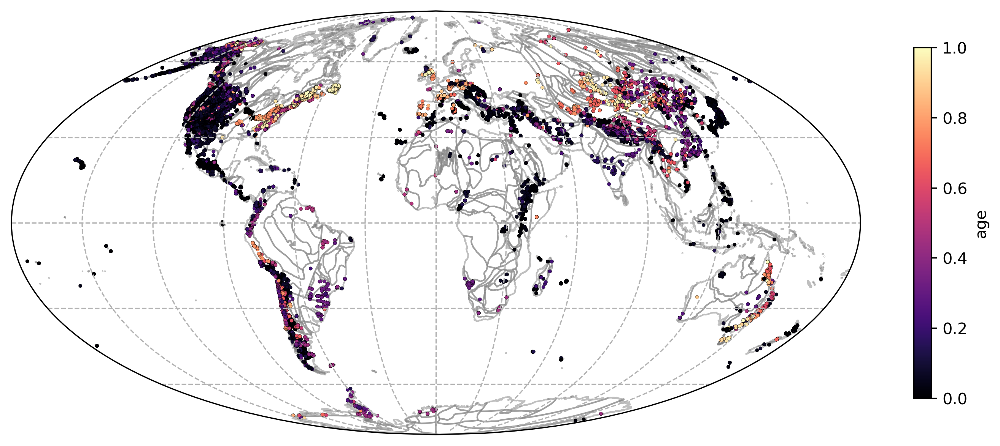

In [12]:

all_liu=plotgdf(paleoelevations_ld,mollweide=True,column="age",cbar=True,markersize=5,cmap="magma")

<Axes: >

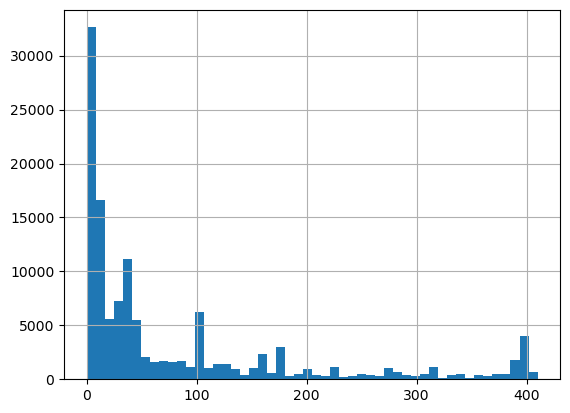

In [13]:
paleoelevations_ld['age'].hist(bins=50)

In [56]:
import pyproj
from shapely.geometry import Point
from shapely.ops import transform
from functools import partial
import rioxarray
import tempfile
import os
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import os
import pandas as pd
import rioxarray

def generate_offset_points(lon, lat, radius_km=10, n_points=12):
    """
    Generate points in a circle of radius_km around (lon, lat)
    """
    proj_wgs84 = pyproj.Proj('epsg:4326')

    # Azimuthal equidistant projection centered on the point
    proj_aeqd = pyproj.Proj(proj='aeqd', lat_0=lat, lon_0=lon)
    transformer_to_aeqd = partial(pyproj.transform, proj_wgs84, proj_aeqd)
    transformer_to_wgs84 = partial(pyproj.transform, proj_aeqd, proj_wgs84)

    center = Point(0, 0)
    circle = center.buffer(radius_km * 1000)  # meters
    circle_wgs84 = transform(transformer_to_wgs84, circle)

    # Sample points along the circle boundary
    sampled_points = list(circle_wgs84.exterior.coords)[::len(circle_wgs84.exterior.coords)//n_points]

    return sampled_points


def resample_raster(file_path):
    # Open the raster
    data = rioxarray.open_rasterio(file_path, masked=True).squeeze()

    # Coarsen by a factor of 5 in both directions
    coarsened = data.coarsen(x=2, y=2, boundary="trim").mean()

    # Save to a temporary file for rasterio
    temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".tif")
    coarsened.rio.to_raster(temp_file.name)

    return temp_file.name

In [18]:
from pyrolite.util.time import Timescale
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import numpy as np

ts = Timescale()

# Only use specific levels
selected_levels = ["Period", "Epoch", "Age"]
xlims = {
    "Period": (0, 1),
    "Epoch": (1, 2),
    "Age": (2, 3),
}

fig, ax = plt.subplots(1, figsize=(0.5, 10), dpi=300)

for ix, level in enumerate(selected_levels[::-1]):
    ldf = ts.data.loc[ts.data.Level == level, :]
    for pix, period in ldf.iterrows():
        left, right = xlims[level]
        if ix != len(selected_levels) - 1:
            time = np.mean(ts.text2age(period.Name))
            general = None
            _ix = ix
            while general is None:
                try:
                    general = ts.named_age(time, level=selected_levels[::-1][_ix + 1])
                except:
                    break
                _ix += 1
            if general is not None:
                _l, _r = xlims[selected_levels[::-1][_ix]]
                if _r > left:
                    left = _r

        rect = Rectangle(
            (left, period.End),
            right - left,
            period.Start - period.End,
            facecolor=period.Color,
            edgecolor="k",
        )
        ax.add_artist(rect)

# Set x-ticks only for selected levels
# ax.set_xticks([np.mean(xlims[lvl]) for lvl in selected_levels])
# ax.set_xticklabels(selected_levels, rotation=60)
ax.xaxis.set_ticks_position("top")
ax.set_xlim(min(v[0] for v in xlims.values()), max(v[1] for v in xlims.values()))
ax.set_ylabel("Age (Ma)")
ax.set_ylim(200, 0)  # Adjust as needed
plt.tight_layout()
plt.savefig("/Volumes/SatyamData/Paper3/PaleotopographyFigures/Geological_Time_ScaleZhou.jpg", dpi=300)
plt.close()

# Run from Here
## Geochemical Paleoelevation Grid 

In [50]:
spatial_resolution = 0.1
threshold_distance=5
temporal_resolution = 10
end_time = 201
ml_model_name="DL"

geochemical_file=f"{MODEL_DIR}/GeochemicalData/paleoelevations_global.csv"

In [27]:
paleoelevations_ld=pd.read_csv(geochemical_file)
columns=['la_yb_elevation', 'ce_yb_elevation', 'lu_hf_elevation',
       'nd_yb_elevation', 'la_y_elevation', 'nb_y_elevation',
       'sm_yb_elevation', 'ce_y_elevation', 'nd_y_elevation',
       'th_yb_elevation', 'hf_ppm_elevation', 'la_sm_elevation',
       'gd_yb_elevation', 'ba_v_elevation', 'mno_elevation', 'k2o_elevation',
       'zr_y_elevation', 'ba_sc_elevation', 'a_elevation', 'nb_yb_elevation',
       'dy_yb_elevation', 'a_cao_elevation', 'th_y_elevation', 'cao_elevation',
       'rb_ppm_elevation', 'ni_sc_elevation', 'sc_ppm_elevation',
       'ga_ppm_elevation', 'pb_ppm_elevation', 'ba_ppm_elevation',
       'u_ppm_elevation', 'feo_tot_elevation', 'cr_sc_elevation',
       'ni_ppm_elevation', 'sr_y_elevation', 'sr_ppm_elevation',
       'zr_ti_elevation', 'ni_v_elevation', 'cr_v_elevation']

paleoelevations_ld["Elevation (Median)"]=paleoelevations_ld[columns].median(axis=1)
paleoelevations_ld["Elevation (Median)"]=paleoelevations_ld["Elevation (Median)"].astype('float')
paleoelevations_ld["Elevation (Std)"]=paleoelevations_ld[columns].std(axis=1)
paleoelevations_ld["Elevation (Std)"]=paleoelevations_ld["Elevation (Std)"].astype('float')
# Only keep rows with more than 15 non-NaN values in 'columns'
mask = paleoelevations_ld[columns].notna().sum(axis=1) > 15
paleoelevations_ld = paleoelevations_ld[mask].copy()

In [28]:
columns=['la_yb_elevation', 'ce_yb_elevation', 'lu_hf_elevation',
       'nd_yb_elevation', 'la_y_elevation', 'nb_y_elevation',
       'sm_yb_elevation', 'ce_y_elevation', 'nd_y_elevation',
       'th_yb_elevation', 'hf_ppm_elevation', 'la_sm_elevation',
       'gd_yb_elevation', 'ba_v_elevation', 'mno_elevation', 'k2o_elevation',
       'zr_y_elevation', 'ba_sc_elevation', 'a_elevation', 'nb_yb_elevation',
       'dy_yb_elevation', 'a_cao_elevation', 'th_y_elevation', 'cao_elevation',
       'rb_ppm_elevation', 'ni_sc_elevation', 'sc_ppm_elevation',
       'ga_ppm_elevation', 'pb_ppm_elevation', 'ba_ppm_elevation',
       'u_ppm_elevation', 'feo_tot_elevation', 'cr_sc_elevation',
       'ni_ppm_elevation', 'sr_y_elevation', 'sr_ppm_elevation',
       'zr_ti_elevation', 'ni_v_elevation', 'cr_v_elevation']

len(columns)

39

In [18]:
reconstructed_pls=[]
for reconstruction_time in range(0,end_time,int(temporal_resolution)):  # 0 to 411 inclusive
    pl = paleoelevations_ld[(paleoelevations_ld['age'] > reconstruction_time-5) & (paleoelevations_ld['age'] < reconstruction_time + 5)].copy()

    gpts = gplately.Points(PK.model, pl['Longitude'],  pl['Latitude'], time=0)
    rlons, rlats = gpts.reconstruct(time=reconstruction_time, return_array=True)

    pl['Reconstructed Longitude'] = rlons
    pl['Reconstructed Latitude'] = rlats
    pl['Reconstruction Time'] = reconstruction_time
    # pl['geometry'] = gpd.points_from_xy(rlons, rlats)
    reconstructed_pls.append(pl)

In [19]:
recon_pl_gdf=pd.concat(reconstructed_pls)
recon_pl_gdf

,la_yb_elevation,ce_yb_elevation,lu_hf_elevation,nd_yb_elevation,la_y_elevation,nb_y_elevation,sm_yb_elevation,ce_y_elevation,nd_y_elevation,th_yb_elevation,...,ni_v_elevation,cr_v_elevation,age,Longitude,Latitude,Elevation (Median),Elevation (Std),Reconstructed Longitude,Reconstructed Latitude,Reconstruction Time
1053,2253.292055,2306.256330,NaN,3331.656944,1783.231552,NaN,4411.402960,1714.709589,2776.153393,NaN,...,NaN,NaN,3.95,127.750000,42.05500,1942.531490,1315.736150,127.750000,42.055000,0
1067,2998.529880,2564.746896,NaN,2011.689790,2820.371990,4639.566199,3109.505822,2188.441345,1616.729573,NaN,...,NaN,NaN,1.35,127.040000,42.34580,2477.292715,1332.473610,127.040000,42.345800,0
1068,2605.770020,2144.013106,NaN,1511.263696,2160.314556,4561.952901,2621.042952,1543.811043,774.494613,NaN,...,NaN,NaN,1.35,127.040000,42.34580,2160.314556,1369.860604,127.040000,42.345800,0
1141,3625.463337,3804.002582,3444.167962,4167.939918,3252.961616,NaN,4093.959180,3396.318506,4082.111970,1314.401608,...,73.430851,-529.146887,4.50,128.050000,42.00000,2920.498046,2056.779815,128.050000,42.000000,0
1142,3770.537619,3650.559387,4095.381747,4070.436288,3449.425965,NaN,4310.534937,3209.517735,3726.865765,1938.998808,...,1897.688104,1287.386498,4.50,128.050000,42.00000,2851.993492,1427.604349,128.050000,42.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125314,3020.133626,2901.344992,1756.621419,2618.948704,2426.013330,1336.116943,2508.100736,2013.791228,1797.772883,2548.020946,...,NaN,9769.297791,204.00,73.442700,38.93500,2467.057033,2068.197244,76.068172,24.744070,200
125324,3331.213125,3331.491322,2975.894188,2992.975953,3634.964908,3526.681413,2627.051542,3552.461669,3376.877640,4561.431561,...,2836.698423,3983.758562,202.00,103.116667,21.45000,3331.491322,1532.617239,108.522455,39.027699,200
125538,2463.135281,2462.300492,2664.552183,2556.661638,2528.357794,3575.671309,2407.747165,2404.892693,2504.441873,2054.108520,...,NaN,NaN,203.00,-66.266670,-70.60000,2462.300492,978.445523,-47.826257,-63.378251,200
125546,1658.245839,1849.155042,2158.315747,2029.943345,1512.914415,1458.446610,1794.851662,1558.261841,1570.652323,1454.573716,...,-45.067461,-187.786230,203.00,-67.516660,-70.38333,1535.588128,912.975533,-48.853285,-63.478916,200


In [20]:
# df=pd.read_parquet(f"{DEFAULT_OUTPUT_CSV}/Prediction_{WINDOW_SIZE}_NEW/Predicted_{MODEL_NAME}_{reconstruction_time}Ma.parquet")

In [63]:
spatial_resolution = 0.1
temporal_resolution = 10
end_time = 201
ml_model_name="DL"

data_vars_error = {}
data_vars_elevation = {}
data_vars_count = {}
data_vars_std = {}
mean_errors=[]
mean_errors_abs=[]
counts=[]
stds=[]
times=[]
WS=25
for reconstruction_time in range(0, end_time,int(temporal_resolution)):  # 0 to 411 inclusive
    # try:
        # Subset dataframe
    gdfc = recon_pl_gdf[recon_pl_gdf['Reconstruction Time'] == reconstruction_time].copy()
    if gdfc.empty:
        print(f"Skipping time={reconstruction_time} (no data)")
        continue

    # Observed/interpolated grid
    da = df_to_NetCDF(
        x=gdfc['Reconstructed Longitude'],
        y=gdfc['Reconstructed Latitude'],
        z=gdfc["Elevation (Median)"],
        statistic='median',
        grid_resolution=spatial_resolution,
        clip=(None, None),
        lat_bin_edges=np.arange(-90, 90 + spatial_resolution, spatial_resolution),
        lon_bin_edges=np.arange(-180, 180 + spatial_resolution, spatial_resolution),
    )

    da_count = df_to_NetCDF(
        x=gdfc['Reconstructed Longitude'],
        y=gdfc['Reconstructed Latitude'],
        z=gdfc["Elevation (Median)"],
        statistic='count',
        grid_resolution=spatial_resolution,
        clip=(None, None),
        lat_bin_edges=np.arange(-90, 90 + spatial_resolution, spatial_resolution),
        lon_bin_edges=np.arange(-180, 180 + spatial_resolution, spatial_resolution),
    )

    da_std = df_to_NetCDF(
        x=gdfc['Reconstructed Longitude'],
        y=gdfc['Reconstructed Latitude'],
        z=gdfc["Elevation (Std)"],
        statistic='mean',
        grid_resolution=spatial_resolution,
        clip=(None, None),
        lat_bin_edges=np.arange(-90, 90 + spatial_resolution, spatial_resolution),
        lon_bin_edges=np.arange(-180, 180 + spatial_resolution, spatial_resolution),
    )

    da=post_process_grid(da,threshold_distance=5)

    print(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Model_{WINDOW_SIZE}_MANTLE_interpolated_ver2/{ml_model_name}_Model_{MODEL_NAME}_{reconstruction_time}.nc")
    # # Predicted dataset
    db = xr.open_dataset(
        f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Model_{WINDOW_SIZE}_MANTLE_interpolated_ver2/{ml_model_name}_Model_{MODEL_NAME}_{reconstruction_time}.nc"
    )


    # # Compute error grid
    # error_grid = da.values - db[f"Elevation{ml_model_name}"].values
    # error_grid_abs=abs(da.values - db[f"Elevation{ml_model_name}"].values)


    # Compute error grid
    pred_grid = db[f"Elevation{ml_model_name}"].values
    error_grid = da.values - pred_grid
    error_grid_abs = np.abs(error_grid)
        # Mask elevation grid — keep only cells where error exists (both values non-NaN)
    valid_mask = ~np.isnan(error_grid)
    elevation_clean = np.where(valid_mask, da.values, np.nan)





    # Save only cleaned elevation grid
    data_vars_elevation[f"Reconstruction_Time_{reconstruction_time}"] = (
        ("Latitude", "Longitude"), elevation_clean
    )

    data_vars_count[f"Reconstruction_Time_{reconstruction_time}"] = (
        ("Latitude", "Longitude"), da_count.values
    )


    data_vars_std[f"Reconstruction_Time_{reconstruction_time}"] = (
        ("Latitude", "Longitude"), da_std.values
    )

    # Store as DataArray
    data_vars_error[f"Reconstruction_Time_{reconstruction_time}"] = (
        ("Latitude", "Longitude"), error_grid
    )
    mean_error=np.nanmean(error_grid)
    mean_error_abs=np.nanmean(error_grid_abs)
    count=len(gdfc.dropna(subset=["Elevation (Median)"]))
    stds.append(np.nanmean(da_std.values))
    mean_errors.append(mean_error)
    mean_errors_abs.append(mean_error_abs)
    counts.append(count)
    times.append(reconstruction_time)

    print(f"Done time={reconstruction_time}, mean error={np.nanmean(error_grid):.3f},abs mean error={mean_error_abs:.3f}, count={count}, std={np.nanmean(da_std.values):.3f}")

    # except FileNotFoundError:
    #     print(f"Skipping time={reconstruction_time}, file not found")
    # except Exception as e:
    #     print(f"Error at time={reconstruction_time}: {e}")
    # break


# Build Dataset
elevation_ds= xr.Dataset(
    data_vars=data_vars_elevation,
    coords={
        "Latitude": da["Latitude"].values,
        "Longitude": da["Longitude"].values,
    }
)
# Save
elevation_ds.to_netcdf(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_GeochemicalElevation_Grids.nc")
print("All elevation grids saved as multiple variables in a single NetCDF")

count_ds= xr.Dataset(
    data_vars=data_vars_count,
    coords={
        "Latitude": da["Latitude"].values,
        "Longitude": da["Longitude"].values,
    }
)
# Save  
count_ds.to_netcdf(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_DataPointCount_Grids.nc")
print("All data point count grids saved as multiple variables in a single NetCDF")
std_ds= xr.Dataset(
    data_vars=data_vars_std,
    coords={
        "Latitude": da["Latitude"].values,
        "Longitude": da["Longitude"].values,
    }
)
# Save
std_ds.to_netcdf(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_DataPointSTD_Grids.nc")
print("All data point std grids saved as multiple variables in a single NetCDF")

error_ds = xr.Dataset(
    data_vars=data_vars_error,
    coords={
        "Latitude": da["Latitude"].values,
        "Longitude": da["Longitude"].values,
    }
)

# Save
error_ds.to_netcdf(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Error_Grids.nc")
print("All error grids saved as multiple variables in a single NetCDF")


Interpolated 38196 points
/Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/NetCDF/DL_Model_25_MANTLE_interpolated_ver2/DL_Model_Merdith1Ga_0.nc
Done time=0, mean error=1268.911,abs mean error=1487.592, count=10369, std=1373.579
Interpolated 35028 points
/Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/NetCDF/DL_Model_25_MANTLE_interpolated_ver2/DL_Model_Merdith1Ga_10.nc
Done time=10, mean error=1218.782,abs mean error=1522.555, count=6900, std=1412.030
Interpolated 21884 points
/Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/NetCDF/DL_Model_25_MANTLE_interpolated_ver2/DL_Model_Merdith1Ga_20.nc
Done time=20, mean error=1795.601,abs mean error=1958.883, count=2667, std=1506.706
Interpolated 30260 points
/Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/NetCDF/DL_Model_25_MANTLE_interpolated_ver2/DL_Model_Merdith1Ga_30.nc
Done time=30, mean error=2099.904,abs mean error=2197.842, count=3612, std=1638.922
Interpolated 

In [63]:
error_ds=xr.open_dataset(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Error_Grids.nc")
count_ds=xr.open_dataset(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_DataPointCount_Grids.nc")

In [36]:
import xarray as xr
import pandas as pd

# Times you want to consider
times = list(range(200, -1, -10))

count_less_1515 = []
count_less_1000 = []
count_greater_1000 = []

for t in times:
    error_values = error_ds[f'Reconstruction_Time_{t}']
    cell_counts = count_ds[f'Reconstruction_Time_{t}']  # Number of points per cell
    
    # Weighted counts: multiply boolean mask by cell counts, then sum
    count_less_1515.append(((error_values <= 1515) * cell_counts).sum().item())
    count_less_1000.append(((error_values <= 1000) * cell_counts).sum().item())
    count_greater_1000.append(((error_values > 1000) * cell_counts).sum().item())
    

# Create summary DataFrame
summary_df = pd.DataFrame({
    'Time': times,
    'Count_Error<=1515': count_less_1515,
    'Count_Error<=1000': count_less_1000,
    'Count_Error>1000': count_greater_1000
})
summary_df['Total_Count'] = summary_df['Count_Error<=1000'] + summary_df['Count_Error>1000']
# Total counts across all times
total_less_1515 = sum(count_less_1515)
total_less_1000 = sum(count_less_1000)
total_greater_1000 = sum(count_greater_1000)

print(summary_df)
print(f"\nTotal points with error <= 1515 across all times: {total_less_1515}")
print(f"Total points with error <= 1000 across all times: {total_less_1000}")
print(f"Total points with error > 1000 across all times: {total_greater_1000}")


    Time  Count_Error<=1515  Count_Error<=1000  Count_Error>1000  Total_Count
0    200              104.0               96.0              49.0        145.0
1    190               50.0               37.0              41.0         78.0
2    180               35.0               29.0              39.0         68.0
3    170               87.0               76.0             151.0        227.0
4    160              263.0              247.0             231.0        478.0
5    150               68.0               51.0              77.0        128.0
6    140              145.0              131.0             108.0        239.0
7    130               25.0               23.0              67.0         90.0
8    120              228.0              203.0             166.0        369.0
9    110              121.0               74.0             246.0        320.0
10   100              532.0              402.0            1167.0       1569.0
11    90              244.0              130.0             400.0

In [35]:
print(total_less_1515 / (total_less_1000 + total_greater_1000))

0.5959945475516409


In [37]:
print(total_less_1000 / (total_less_1000 + total_greater_1000))

0.4867358708189158


In [32]:
count_ds[f'Reconstruction_Time_0'].sum().item()

10369.0

In [83]:
error_ds.to_netcdf(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Error_Grids2.nc")

In [53]:
# Global weighted mean error across all times
weighted_mean_error = np.nansum(np.array(mean_errors) * np.array(counts)) / np.nansum(counts)
print(f"Global weighted mean error: {weighted_mean_error:.3f}")

Global weighted mean error: 1721.985


In [54]:
mean_error=0
for i in range(len(mean_errors_abs)):
    mean_error+=counts[i]*mean_errors_abs[i]

total_count=sum(counts)
weighted_mean_error=mean_error/total_count
print(f"Weighted Mean Abs Error={weighted_mean_error}")

Weighted Mean Abs Error=1930.7971933570961


In [51]:

mean_present_elevation=-732
print(f"Mean Present Elevation={mean_present_elevation}")

Mean Present Elevation=-732


In [55]:
### Comparing with Mean present day elevation of active margins

error_with_baseline=(paleoelevations_ld["Elevation (Median)"]-mean_present_elevation).mean(skipna=True)

/var/folders/qr/01bxwnvn05s319mx5c07sd7w0000gp/T/ipykernel_44170/2989979613.py:202: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


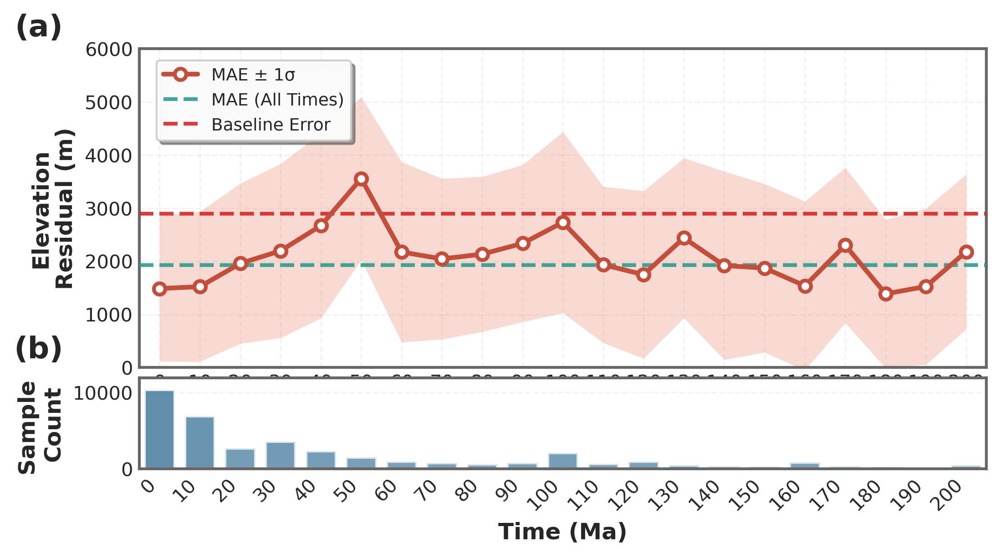

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Style settings for publication quality
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 9
plt.rcParams['legend.framealpha'] = 0.95

# Prepare DataFrame
temporal_resolution = 10
# times = np.arange(0, 190, int(temporal_resolution))
pls_gdf = pd.DataFrame({
    "counts": counts,
    "error": mean_errors_abs,
    "stds": stds,
    "Time": times
})

# Color palette - sophisticated and colorblind-friendly
colors = {
    'fill': '#E76F51',
    'fill_alpha': 0.25,
    'mean_line': '#C44E3A',
    'box': '#E8E8E8',
    'box_edge': '#666666',
    'median': '#2C2C2C',
    'baseline': '#D62828',
    'weighted': '#2A9D8F',
    'bars': '#457B9D',
    'grid': '#CCCCCC'
}

# Create figure
fig = plt.figure(figsize=(8, 4), dpi=300)
gs = plt.GridSpec(2, 1, height_ratios=[3.5, 1], hspace=0.05)

# ============= Top subplot - Residuals with filled error =============
ax1 = fig.add_subplot(gs[0])

# Create x-axis positions
x_pos = np.arange(len(pls_gdf['Time']))

# Plot filled error region (mean ± std)
ax1.fill_between(
    x_pos,
    pls_gdf['error'] - pls_gdf['stds'],
    pls_gdf['error'] + pls_gdf['stds'],
    color=colors['fill'],
    alpha=colors['fill_alpha'],
    # label='Mean ± 1σ',
    linewidth=0
)

# Plot mean line
ax1.plot(
    x_pos,
    pls_gdf['error'],
    color=colors['mean_line'],
    linewidth=2.5,
    marker='o',
    markersize=6,
    markerfacecolor='white',
    markeredgewidth=2,
    markeredgecolor=colors['mean_line'],
    label='MAE ± 1σ',
    zorder=5
)

# # Add subtle boxplots for distribution context
# bp = ax1.boxplot(
#     [pls_gdf['error'].values] * len(x_pos),  # Simplified for visualization
#     positions=x_pos,
#     widths=0.6,
#     patch_artist=True,
#     showfliers=False,
#     showcaps=False,
#     whiskerprops=dict(color=colors['box_edge'], linewidth=0.8, alpha=0.4),
#     boxprops=dict(facecolor=colors['box'], edgecolor=colors['box_edge'], 
#                   linewidth=0.8, alpha=0.3),
#     medianprops=dict(color=colors['median'], linewidth=1.5, alpha=0.5),
#     zorder=1
# )

# Reference lines
ax1.axhline(
    weighted_mean_error, 
    color=colors['weighted'], 
    linestyle='--', 
    linewidth=2, 
    label='MAE (All Times)',
    zorder=3,
    alpha=0.9
)
ax1.axhline(
    error_with_baseline, 
    color=colors['baseline'], 
    linestyle='--', 
    linewidth=2, 
    label='Baseline Error',
    zorder=3,
    alpha=0.9
)
ax1.axhline(0, color='gray', linestyle='-', linewidth=1, alpha=0.2, zorder=1)

# Styling ax1
ax1.set_ylabel("Elevation\nResidual (m)", fontsize=12, fontweight='bold')
ax1.set_ylim(0, 6000)
ax1.grid(True, linestyle='--', alpha=0.25, linewidth=0.8, color=colors['grid'])
ax1.set_axisbelow(True)

# Enhanced legend
ax1.legend(
    loc="upper left", 
    fontsize=9, 
    frameon=True, 
    facecolor='white', 
    edgecolor='#CCCCCC',
    framealpha=0.95,
    shadow=True,
    bbox_to_anchor=(0.01, 0.99)
)

# Remove x-axis labels from top plot
ax1.set_xticklabels([])
# ax1.tick_params(axis='x', length=0)

# Add subtle spine styling
for spine in ax1.spines.values():
    spine.set_color('#666666')
    spine.set_linewidth(1.5)

# ============= Bottom subplot - Sample counts =============
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# Gradient bars for visual appeal
bars = ax2.bar(
    x=x_pos,
    height=pls_gdf['counts'],
    width=0.75,
    color=colors['bars'],
    alpha=0.8,
    align="center",
    edgecolor='white',
    linewidth=1.5
)

# Add gradient effect to bars
for i, bar in enumerate(bars):
    # Vary alpha slightly for depth
    bar.set_alpha(0.7 + 0.15 * (pls_gdf['counts'].iloc[i] / pls_gdf['counts'].max()))

# Styling ax2
ax2.set_ylabel("Sample \nCount", fontsize=12, fontweight='bold')
ax2.set_xlabel("Time (Ma)", fontsize=12, fontweight='bold')
ax2.set_ylim(0, pls_gdf['counts'].max() * 1.15)
ax2.grid(False)

# Add subtle horizontal gridlines for counts
ax2.yaxis.grid(True, linestyle='--', alpha=0.2, linewidth=0.8, color=colors['grid'])
ax2.set_axisbelow(True)

# Spine styling
for spine in ax2.spines.values():
    spine.set_color('#666666')
    spine.set_linewidth(1.5)

# ============= Common x-axis settings =============
for ax in [ax1, ax2]:
    ax.set_xticks(x_pos)
    ax.set_xlim(-0.5, len(pls_gdf['Time']) - 0.5)

# Only set x-labels on bottom plot
ax2.set_xticklabels(pls_gdf['Time'], rotation=45, ha='right')

# ============= Panel labels =============
ax1.text(
    -0.09, 1.02, '(a)', 
    transform=ax1.transAxes, 
    fontsize=16, 
    fontweight='bold',
    va='bottom',
    ha='right'
)
ax2.text(
    -0.09, 1.15, '(b)', 
    transform=ax2.transAxes, 
    fontsize=16, 
    fontweight='bold',
    va='bottom',
    ha='right'
)

# Final adjustments
plt.tight_layout()
plt.savefig(f"{DEFAULT_OUTPUT_FIG}/residuals_and_samples.png", dpi=300, bbox_inches='tight', facecolor='white')

plt.show()

## Figure and Animation of Misfit

In [70]:
error_ds= xr.open_dataset(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Error_Grids2.nc")
elevation_ds= xr.open_dataset(f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_GeochemicalElevation_Grids.nc") 


In [30]:
error_ds

<xarray.Dataset> Size: 1GB
Dimensions:                  (Latitude: 1800, Longitude: 3600)
Coordinates:
  * Latitude                 (Latitude) float64 14kB -89.95 -89.85 ... 89.95
  * Longitude                (Longitude) float64 29kB -179.9 -179.8 ... 179.9
Data variables: (12/21)
    Reconstruction_Time_0    (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_10   (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_20   (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_30   (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_40   (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_50   (Latitude, Longitude) float64 52MB ...
    ...                       ...
    Reconstruction_Time_150  (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_160  (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_170  (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_180  (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_190  (Latitude, Longitude) float64 52MB ...
    Reconstruction_Time_200  (Latitude, Longitude) float64 52MB ...

In [42]:
paleonetcdf.mean()

Latitude                      2.420729
Longitude                   -35.229223
Reconstruction_Time_200    2181.098966
dtype: float64

In [64]:

temporal_resolution = 10  # Example interval for time steps
# # Set projection to Mollweide
# ax = fig.add_axes([0, 0, 1, 1], projection=ccrs.Mollweide())

# )
create_directory_if_not_exists(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022Comparison")
for reconstruction_time in range(0, 201,temporal_resolution):
    print(f"Working on {reconstruction_time} Ma")

    # error_ds[f'Reconstruction_Time_{reconstruction_time}'].to_dataframe().dropna().reset_index()
    paleonetcdf=error_ds[f'Reconstruction_Time_{reconstruction_time}'].to_dataframe().dropna().reset_index()
    pls_gdfc =gpd.GeoDataFrame(paleonetcdf,geometry=gpd.points_from_xy(paleonetcdf['Longitude'],paleonetcdf['Latitude']))
    pls_gdfc=pls_gdfc.set_crs("epsg:4326")
    fig = plt.figure(figsize=[9, 6],dpi=300)
    central_longitude=0
    ax = fig.add_subplot(111, projection=ccrs.Robinson(central_longitude=central_longitude))
    # ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=0))

    ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))
    robinson_proj = f"+proj=robin +lon_0={central_longitude} +datum=WGS84 +units=m +no_defs"


    pls_gdfc = pls_gdfc.to_crs(robinson_proj)

    gplot.time = reconstruction_time  # Ma
    # gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)
    gplot.plot_continents(ax, facecolor='grey',edgecolor=None, alpha=0.2)
        # gplot.plot_coastlines(ax, color='khaki', alpha=0.5)
    gplot.plot_coastlines(ax, facecolor='grey', alpha=0.05)



    gplot.plot_trenches(ax, color='black',alpha=0.2)
    gplot.plot_subduction_teeth(ax, color='black', alpha=0.2)

    pls_gdfc.plot(ax=ax, column=f"Reconstruction_Time_{reconstruction_time}", 
                  cmap=cmc.berlin, 
                  vmin=-4000, vmax=4000,
                    markersize=40, 
                    edgecolor='black',
                    # edgecolor='None',
                    linewidth=0.05, 
                    alpha=1.0)

    ax.set_global()

    # ax.text(0.01, 0.95, f'Time: {reconstruction_time} Ma', transform=ax.transAxes,
    #         fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.1))
    plt.tight_layout()
    plt.savefig(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022Comparison/Error_Elevation_Median_{reconstruction_time}.jpg", dpi=300)
    plt.close()
    # break
    # plt.show()


Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/GlobalLF2022Comparison
Working on 0 Ma
Working on 10 Ma
Working on 20 Ma
Working on 30 Ma
Working on 40 Ma
Working on 50 Ma
Working on 60 Ma
Working on 70 Ma
Working on 80 Ma
Working on 90 Ma
Working on 100 Ma
Working on 110 Ma
Working on 120 Ma
Working on 130 Ma
Working on 140 Ma
Working on 150 Ma
Working on 160 Ma
Working on 170 Ma
Working on 180 Ma
Working on 190 Ma
Working on 200 Ma


In [65]:

temporal_resolution = 10  # Example interval for time steps
# # Set projection to Mollweide
# ax = fig.add_axes([0, 0, 1, 1], projection=ccrs.Mollweide())

# )
create_directory_if_not_exists(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022Comparison_Figures")
times=[0,10,]
for reconstruction_time in range(0, 201,temporal_resolution):
    print(f"Working on {reconstruction_time} Ma")

    # error_ds[f'Reconstruction_Time_{reconstruction_time}'].to_dataframe().dropna().reset_index()
    paleonetcdf=error_ds[f'Reconstruction_Time_{reconstruction_time}'].to_dataframe().dropna().reset_index()
    pls_gdfc =gpd.GeoDataFrame(paleonetcdf,geometry=gpd.points_from_xy(paleonetcdf['Longitude'],paleonetcdf['Latitude']))
    pls_gdfc=pls_gdfc.set_crs("epsg:4326")
    fig = plt.figure(figsize=[9, 6],dpi=300)
    central_longitude=0
    ax = fig.add_subplot(111, projection=ccrs.Robinson(central_longitude=central_longitude))
    # ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=0))

    ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))
    robinson_proj = f"+proj=robin +lon_0={central_longitude} +datum=WGS84 +units=m +no_defs"


    pls_gdfc = pls_gdfc.to_crs(robinson_proj)

    gplot.time = reconstruction_time  # Ma
    # gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)
    gplot.plot_continents(ax, facecolor='grey',edgecolor=None, alpha=0.2)
        # gplot.plot_coastlines(ax, color='khaki', alpha=0.5)
    gplot.plot_coastlines(ax, facecolor='grey', alpha=0.05)



    gplot.plot_trenches(ax, color='black',alpha=0.2)
    gplot.plot_subduction_teeth(ax, color='black', alpha=0.2)

    pls_gdfc.plot(ax=ax, column=f"Reconstruction_Time_{reconstruction_time}", cmap=cmc.lajolla, vmin=0, vmax=5000,
                    markersize=40, 
                    edgecolor='black',
                    # edgecolor='None',
                    linewidth=0.05, 
                    alpha=1.0)

    ax.set_global()

    ax.text(0.01, 0.95, f'Time: {reconstruction_time} Ma', transform=ax.transAxes,
            fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.1))
    plt.tight_layout()
    plt.savefig(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022Comparison_Figures/Error_Elevation_Median_{reconstruction_time}.jpg", dpi=300)
    plt.close()
    # break
    # plt.show()


Created directory: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/GlobalLF2022Comparison_Figures
Working on 0 Ma
Working on 10 Ma
Working on 20 Ma
Working on 30 Ma
Working on 40 Ma
Working on 50 Ma
Working on 60 Ma
Working on 70 Ma
Working on 80 Ma
Working on 90 Ma
Working on 100 Ma
Working on 110 Ma
Working on 120 Ma
Working on 130 Ma
Working on 140 Ma
Working on 150 Ma
Working on 160 Ma
Working on 170 Ma
Working on 180 Ma
Working on 190 Ma
Working on 200 Ma


In [67]:


# Define the folder and pattern for your image files
image_folder = f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022Comparison_Figures/"
image_pattern = os.path.join(image_folder, '*.jpg')

# # Load all the images matching the pattern
image_files = sorted(glob.glob(image_pattern), key=lambda x: float(os.path.basename(x).split('/')[0].split('.')[0].split('_')[-1]), reverse=True)

# Create a list of images
images = [Image.open(image) for image in image_files]

# Save the images as a GIF
output_path = os.path.join(image_folder, 'GeochemicalProxiesError.gif')
images[0].save(output_path, save_all=True, append_images=images[1:], optimize=False, duration=300, loop=0)

print("GIF created successfully at", output_path)

GIF created successfully at /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/GlobalLF2022Comparison_Figures/GeochemicalProxiesError.gif


## Figure and Animation for Topography from Geochemical Proxies


In [71]:
create_directory_if_not_exists(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022TOPO")
interval = 10  # Example interval for time steps
for reconstruction_time in range(0, 201, 10):
    # if reconstruction_time<=150:
    #     continue
    
    
    print(f"Working on {reconstruction_time} Ma")

    paleonetcdf=elevation_ds[f'Reconstruction_Time_{reconstruction_time}'].to_dataframe().dropna().reset_index()
    pls_gdfc =gpd.GeoDataFrame(paleonetcdf,geometry=gpd.points_from_xy(paleonetcdf['Longitude'],paleonetcdf['Latitude']))
    pls_gdfc=pls_gdfc.set_crs("epsg:4326")





    fig = plt.figure(figsize=[9, 6],dpi=300)
    central_longitude=0
    ax = fig.add_subplot(111, projection=ccrs.Robinson(central_longitude=central_longitude))
    # ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=0))

    ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))
    robinson_proj = f"+proj=robin +lon_0={central_longitude} +datum=WGS84 +units=m +no_defs"


    pls_gdfc = pls_gdfc.to_crs(robinson_proj)



    gplot.time = reconstruction_time  # Ma
    # gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)
    gplot.plot_continents(ax, facecolor='grey',edgecolor=None, alpha=0.2)
        # gplot.plot_coastlines(ax, color='khaki', alpha=0.5)
    gplot.plot_coastlines(ax, facecolor='grey', alpha=0.05)



    gplot.plot_trenches(ax, color='black',alpha=0.2)
    gplot.plot_subduction_teeth(ax, color='black', alpha=0.2)

    pls_gdfc.plot(ax=ax, column=f"Reconstruction_Time_{reconstruction_time}", cmap=ETOPO, vmin=-8000, vmax=8000,
                    markersize=40, 
                    edgecolor='None',
                    linewidth=0.1, 
                    alpha=1.0)

    ax.set_global()


    ax.text(0.02, 0.95, f'Time: {reconstruction_time} Ma', transform=ax.transAxes,
            fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.1))
    plt.tight_layout()
    plt.savefig(f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022TOPO/Elevation_Median_{reconstruction_time}.jpg", dpi=300)
    plt.close()
    # break
    # plt.show()


Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/GlobalLF2022TOPO
Working on 0 Ma
Working on 10 Ma
Working on 20 Ma
Working on 30 Ma
Working on 40 Ma
Working on 50 Ma
Working on 60 Ma
Working on 70 Ma
Working on 80 Ma
Working on 90 Ma
Working on 100 Ma
Working on 110 Ma
Working on 120 Ma
Working on 130 Ma
Working on 140 Ma
Working on 150 Ma
Working on 160 Ma
Working on 170 Ma
Working on 180 Ma
Working on 190 Ma
Working on 200 Ma


In [72]:


# Define the folder and pattern for your image files
image_folder = f"{DEFAULT_OUTPUT_FIG}/GlobalLF2022TOPO/"
image_pattern = os.path.join(image_folder, '*.jpg')

# # Load all the images matching the pattern
image_files = sorted(glob.glob(image_pattern), key=lambda x: float(os.path.basename(x).split('/')[0].split('.')[0].split('_')[-1]), reverse=True)

# Create a list of images
images = [Image.open(image) for image in image_files]

# Save the images as a GIF
output_path = os.path.join(image_folder, 'GeochemicalProxiesElevation.gif')
images[0].save(output_path, save_all=True, append_images=images[1:], optimize=False, duration=300, loop=0)

print("GIF created successfully at", output_path)

GIF created successfully at /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/GlobalLF2022TOPO/GeochemicalProxiesElevation.gif


In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import numpy as np


plt.figure(figsize=(3, 3), dpi=300)
# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 100

# Choose a continuous colormap (e.g., 'viridis')
# continuous_cmap = cm.magma_r

continuous_cmap = ETOPO
# Create a discrete colormap
discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(-8000, 8000, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)
plt.xticks([])
# Plot the image
plt.imshow(data, cmap=discrete_cmap, norm=norm)
plt.colorbar( ticks=[-8000,-4000,0,4000,8000], spacing='proportional', orientation='horizontal',label="Elevation (m)", pad=0.05,shrink=0.7)
plt.show()

NameError: name 'ETOPO' is not defined

<Figure size 900x900 with 0 Axes>

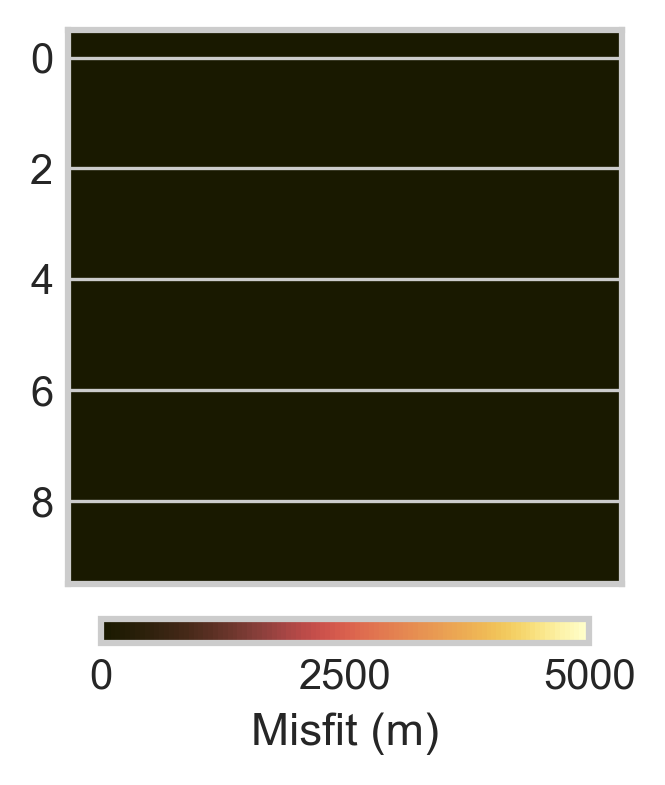

In [220]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import numpy as np


plt.figure(figsize=(3, 3), dpi=300)
# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 100

# Choose a continuous colormap (e.g., 'viridis')
continuous_cmap = cmc.lajolla #vmin=0, vmax=5000

# continuous_cmap = ETOPO
# Create a discrete colormap
discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(0, 5000, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)
plt.xticks([])
# Plot the image
plt.imshow(data, cmap=discrete_cmap, norm=norm)
plt.colorbar( ticks=[0,2500,5000], spacing='proportional', orientation='horizontal',label="Misfit (m)", pad=0.05,shrink=0.7)
plt.show()

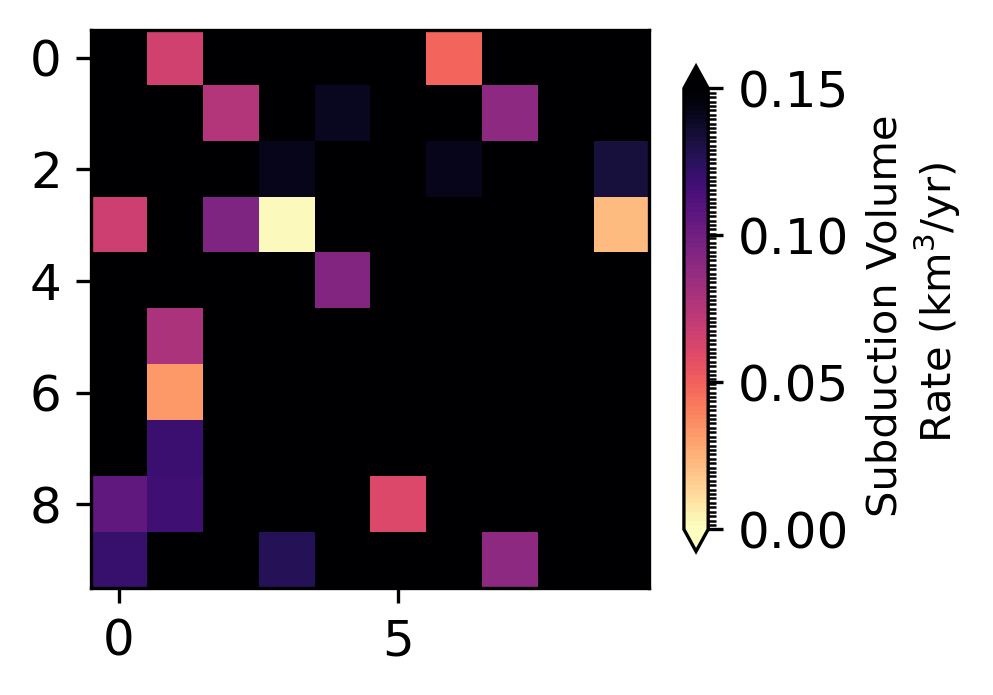

In [37]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import numpy as np


plt.figure(figsize=(3, 3), dpi=300)
# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 100

# Choose a continuous colormap (e.g., 'viridis')
continuous_cmap = cm.magma_r

# continuous_cmap = ETOPO
# Create a discrete colormap
discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(0, 0.15, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)

# Plot the image
plt.imshow(data, cmap=discrete_cmap, norm=norm)
plt.colorbar( ticks=[0,0.05,0.10,0.15], spacing='proportional', orientation='vertical',label="Subduction Volume \n Rate (km$^3$/yr)", pad=0.05,extend='both',shrink=0.7)
plt.show()

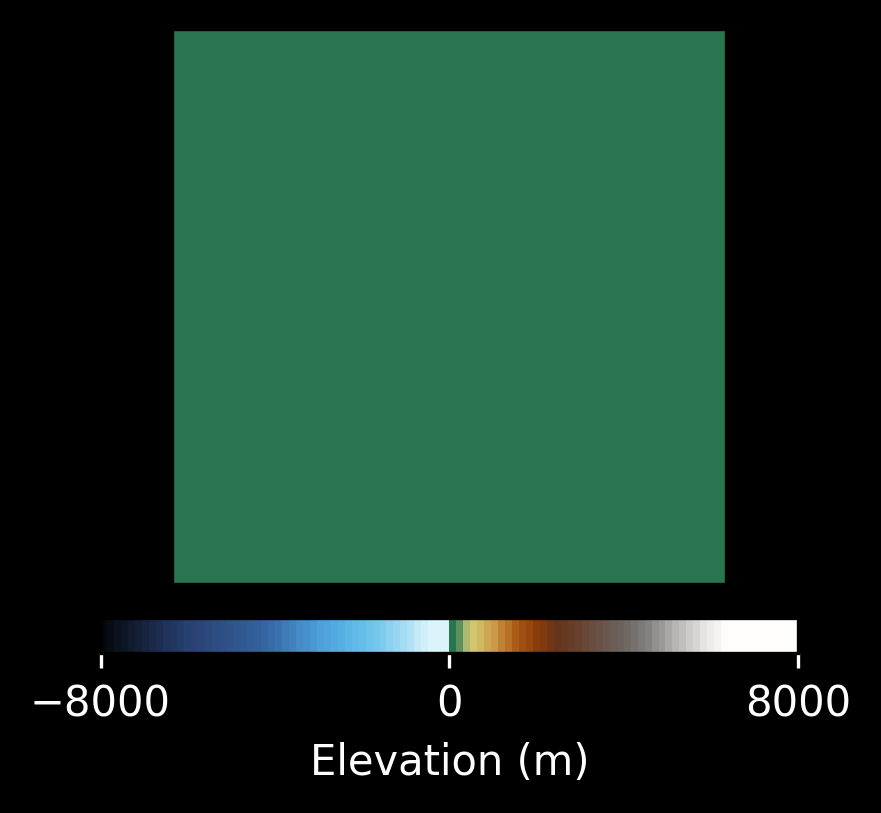

In [307]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import numpy as np

# Dummy colormap for example; replace with actual ETOPO colormap
# e.g., from matplotlib import cm; ETOPO = cm.get_cmap("terrain")
# ETOPO = cmc.batlow  # replace this with your actual ETOPO colormap if needed

# Set figure background and axes facecolor to black
fig, ax = plt.subplots(figsize=(3, 3), dpi=300, facecolor='black')
ax.set_facecolor('black')

# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 100

# Create a discrete colormap from ETOPO or other cmap
discrete_cmap = ListedColormap(ETOPO(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(-8000, 8000, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)

# Plot the image
im = ax.imshow(data, cmap=discrete_cmap, norm=norm)

# Create colorbar with white ticks and label
cbar = plt.colorbar(
    im,
    ax=ax,
    ticks=[-8000, 0, 8000],
    spacing='proportional',
    orientation='horizontal',
    pad=0.05
)
cbar.ax.xaxis.set_tick_params(color='white')
plt.setp(cbar.ax.get_xticklabels(), color='white')
cbar.set_label("Elevation (m)", color='white')

# Hide axes t


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc
import numpy as np

# Dummy colormap for example; replace with actual ETOPO colormap
# e.g., from matplotlib import cm; ETOPO = cm.get_cmap("terrain")
# ETOPO = cmc.batlow  # replace this with your actual ETOPO colormap if needed

# Set figure background and axes facecolor to black
fig, ax = plt.subplots(figsize=(3, 3), dpi=300, facecolor='black')
ax.set_facecolor('black')

# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 100

# Create a discrete colormap from ETOPO or other cmap
discrete_cmap = ListedColormap(ETOPO(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(-8000, 8000, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)

# Plot the image
im = ax.imshow(data, cmap=discrete_cmap, norm=norm)

# Create colorbar with white ticks and label
cbar = plt.colorbar(
    im,
    ax=ax,
    ticks=[-8000, 0, 8000],
    spacing='proportional',
    orientation='horizontal',
    pad=0.05
)
cbar.ax.xaxis.set_tick_params(color='white')
plt.setp(cbar.ax.get_xticklabels(), color='white')
cbar.set_label("Elevation (m)", color='white')

# Hide axes t


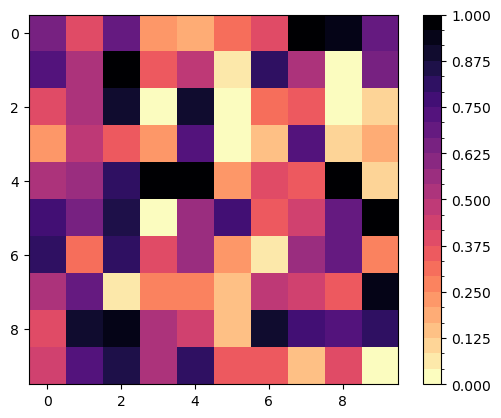

In [44]:
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc

# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 24

# Choose a continuous colormap (e.g., 'viridis')
continuous_cmap = cm.magma_r  # or any other colormap from cmcrameri

# Create a discrete colormap
discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(0, 1, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap.N)

# Plot the image
plt.imshow(data, cmap=discrete_cmap, norm=norm)
plt.colorbar()
plt.show()

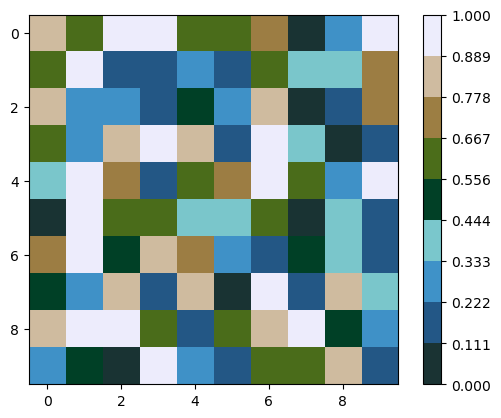

In [54]:
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc

# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 9

# Choose a continuous colormap (e.g., 'viridis')
continuous_cmap = cmc.bukavu  # or any other colormap from cmcrameri

# Create a discrete colormap
discrete_cmap_topo = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(0, 1, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap_topo.N)

# Plot the image
plt.imshow(data, cmap=discrete_cmap_topo, norm=norm)
plt.colorbar()
plt.show()

# East Asia Cordillera


In [17]:
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import pandas as pd

### Plot ETOPO on orthographic projection with coastlines and continents
import cartopy.crs as ccrs
import cmcrameri.cm as cmc  # or use your custom 'ETOPO' colormap
import geopandas as gpd

In [18]:
zhou=pd.read_csv(f"{MODEL_DIR}/EastAsia/Whole_E_Asia.csv")
zhou_gdf= gpd.GeoDataFrame(zhou, geometry=gpd.points_from_xy(zhou['Lon'], zhou['Lat']))
zhou_gdf = zhou_gdf.set_crs("epsg:4326")
zhou_gdf.to_file(f"{MODEL_DIR}/EastAsia/Whole_E_Asia.gpkg")

In [19]:
subdomain_file=f"{MODEL_DIR}/EastAsia/Subdomain.shp"
subdomain = gpd.read_file(subdomain_file)
zhou_joined = gpd.sjoin(zhou_gdf, subdomain, how='left', predicate='within')
zhou_joined_copy=zhou_joined.copy()
zhou_joined_copy['NAME']="East Asia (All)"
zhou_joined=pd.concat([zhou_joined,zhou_joined_copy],ignore_index=True)
grouped = dict(tuple(zhou_joined.groupby('NAME')))


In [92]:
### Eastern China Paleo Elevation Plot

south_china = []
north_china = []
coab = []


for reconstruction_time in range(200, -1, -1):
    print("Reconstruction Time:", reconstruction_time)
    # dl_topo=f"/Volumes/SatyamData/Paper3/NETCDF/Mantle/PaleoDM/DL_Model_phase2_{reconstruction_time}.nc"
    
    dl_topo_dir = f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Model_{WINDOW_SIZE}_MANTLE_interpolated"

    dl_topo = f"{dl_topo_dir}/{ml_model_name}_Model_{MODEL_NAME}_{reconstruction_time}.nc"

    paleonetcdf = xr.open_dataarray(dl_topo)
    paleodf= paleonetcdf.to_dataframe().reset_index()
    paleogdf= gpd.GeoDataFrame(paleodf, geometry=gpd.points_from_xy(paleodf['Longitude'], paleodf['Latitude']))
    paleogdf = paleogdf.set_crs("epsg:4326")


    pygplates.reconstruct(subdomain_file, PK.rotation_model, f"{MODEL_DIR}/EastAsia/tmp.shp", reconstruction_time, anchor_plate_id=PK.anchor_plate_id)

    polygon = gpd.read_file(f"{MODEL_DIR}/EastAsia/tmp.shp")
    polygon = polygon.to_crs("epsg:4326")
    paleogdf= gpd.sjoin(paleogdf, subdomain, how='left', predicate='within')
    paleogdf = paleogdf.dropna(subset=['NAME'])
    paleogdf["Time"]=reconstruction_time
    south_china.append(paleogdf[paleogdf['NAME'] == 'SouthChina'].copy())
    north_china.append(paleogdf[paleogdf['NAME'] == 'NorthChina'].copy())
    coab.append(paleogdf[paleogdf['NAME'] == 'COAB'].copy())



# Filter the paleogdf to only include points within the polygon


Reconstruction Time: 200
Reconstruction Time: 199
Reconstruction Time: 198
Reconstruction Time: 197
Reconstruction Time: 196
Reconstruction Time: 195
Reconstruction Time: 194
Reconstruction Time: 193
Reconstruction Time: 192
Reconstruction Time: 191
Reconstruction Time: 190
Reconstruction Time: 189
Reconstruction Time: 188
Reconstruction Time: 187
Reconstruction Time: 186
Reconstruction Time: 185
Reconstruction Time: 184
Reconstruction Time: 183
Reconstruction Time: 182
Reconstruction Time: 181
Reconstruction Time: 180
Reconstruction Time: 179
Reconstruction Time: 178
Reconstruction Time: 177
Reconstruction Time: 176
Reconstruction Time: 175
Reconstruction Time: 174
Reconstruction Time: 173
Reconstruction Time: 172
Reconstruction Time: 171
Reconstruction Time: 170
Reconstruction Time: 169
Reconstruction Time: 168
Reconstruction Time: 167
Reconstruction Time: 166
Reconstruction Time: 165
Reconstruction Time: 164
Reconstruction Time: 163
Reconstruction Time: 162
Reconstruction Time: 161


In [93]:
south_china_df = pd.concat(south_china, ignore_index=True)
north_china_df = pd.concat(north_china, ignore_index=True)
coab_df = pd.concat(coab, ignore_index=True)
south_china_df = south_china_df.rename(columns={"Time": "ReconstructionTime"})
north_china_df = north_china_df.rename(columns={"Time": "ReconstructionTime"})
coab_df = coab_df.rename(columns={"Time": "ReconstructionTime"})

south_china_df=south_china_df.dropna(subset=['ElevationDL'])
north_china_df=north_china_df.dropna(subset=['ElevationDL'])
coab_df=coab_df.dropna(subset=['ElevationDL'])
all_df=pd.concat([south_china_df,north_china_df,coab_df],ignore_index=True)
all_df['NAME']="East Asia (All)"

south_china_df.to_file(f"{MODEL_DIR}/EastAsia/SouthChinaPaleoElevation.gpkg")
north_china_df.to_file(f"{MODEL_DIR}/EastAsia/NorthChinaPaleoElevation.gpkg")
coab_df.to_file(f"{MODEL_DIR}/EastAsia/COABPaleoElevation.gpkg")



In [28]:
south_china_df=gpd.read_file(f"{MODEL_DIR}/EastAsia/SouthChinaPaleoElevation.gpkg")
north_china_df=gpd.read_file(f"{MODEL_DIR}/EastAsia/NorthChinaPaleoElevation.gpkg")
coab_df=gpd.read_file(f"{MODEL_DIR}/EastAsia/NorthChinaPaleoElevation.gpkg")
all_df=pd.concat([south_china_df,north_china_df,coab_df],ignore_index=True)
all_df['NAME']="East Asia (All)"

Plotting region: COAB


/var/folders/qr/01bxwnvn05s319mx5c07sd7w0000gp/T/ipykernel_24236/1580448277.py:55: UserWarning: You passed a edgecolor/edgecolors ('#045A5E') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


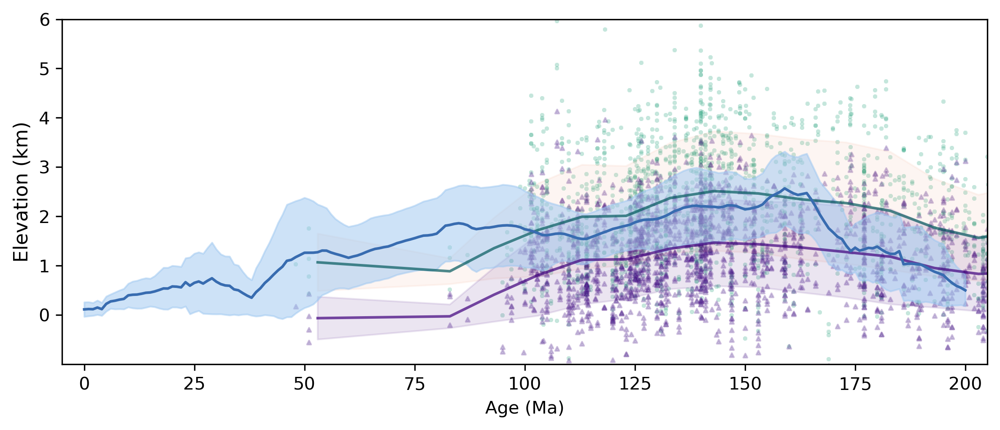

Plotting region: East Asia (All)


/var/folders/qr/01bxwnvn05s319mx5c07sd7w0000gp/T/ipykernel_24236/1580448277.py:55: UserWarning: You passed a edgecolor/edgecolors ('#045A5E') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


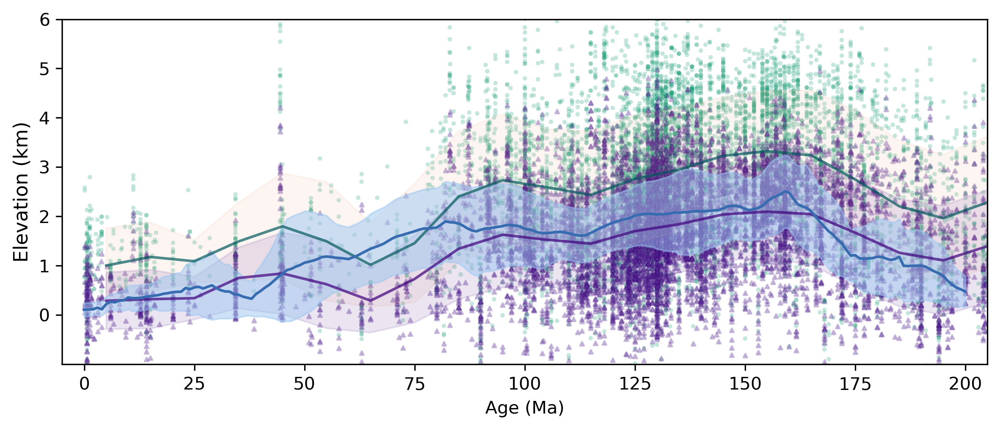

Plotting region: NorthChina


/var/folders/qr/01bxwnvn05s319mx5c07sd7w0000gp/T/ipykernel_24236/1580448277.py:55: UserWarning: You passed a edgecolor/edgecolors ('#045A5E') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


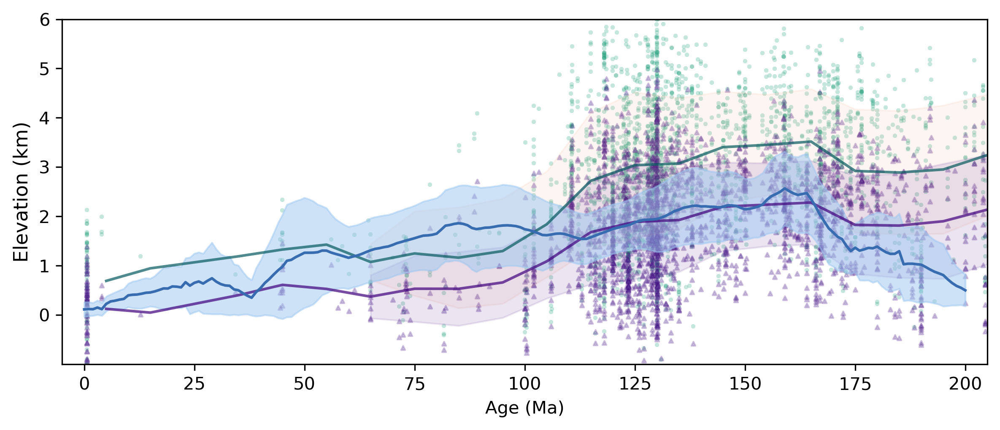

Plotting region: SouthChina


/var/folders/qr/01bxwnvn05s319mx5c07sd7w0000gp/T/ipykernel_24236/1580448277.py:55: UserWarning: You passed a edgecolor/edgecolors ('#045A5E') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


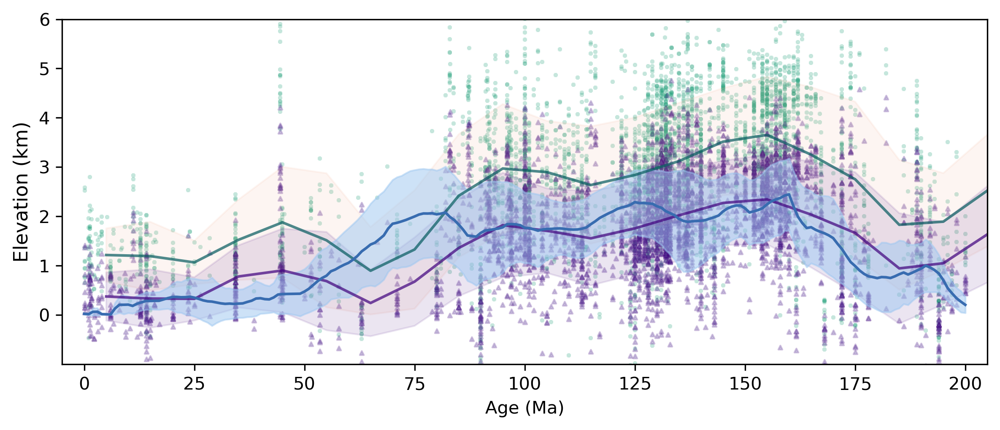

In [66]:


# Colorblind-friendly colors
# colors = {
#     'predicted': '#D55E00',
#     'li2024': "#C00505",
#     'predicted_fill1': '#F4A582',
#     'predicted_fill2': '#FDDBC7',
#     'elevation_mean': "#161616",
#     'elevation_fill': "#827E82"
# }
# colors = {
#     'predicted': '#D55E00',
#     'li2024': '#C00505',
#     'predicted_fill1': '#F4A582',
#     'predicted_fill2': '#FDDBC7',
#     'elevation_mean': '#1B9E77',      # Teal Green (distinct from red/orange)
#     'elevation_fill': '#A6D854'       # Light Lime Green (stands out in fills)
# }

colors = {
    'predicted': '#045A5E',
    'li2024': '#3F007D',
    'predicted_fill1': '#F4A582',
    'predicted_fill2': '#FDDBC7',
    'elevation_mean': '#386CB0',      # Deep Blue (bold and accessible)
    'elevation_fill': "#9CC7F1"       # Soft Cyan (great for fill)
}


# colors = {
#     'predicted': '#D55E00',
#     'li2024': '#C00505',
#     'predicted_fill1': '#F4A582',
#     'predicted_fill2': '#FDDBC7',
#     'elevation_mean': '#4D4D4D',      # Dark Gray
#     'elevation_fill': '#BEBEBE'       # Medium Gray for fill contrast
# }

def plot_region_elevation(name, group, dl_df, save=False):
    """
    Plots predicted and reference paleo-elevation along with ElevationDL for a given region.
    
    Parameters:
        name (str): Region name
        group (pd.DataFrame): Grouped data for that region
        dl_df (pd.DataFrame): Corresponding ElevationDL dataframe
        save (bool): Save the figure if True
    """
    plt.figure(figsize=(8, 3.5), dpi=300)

    # Plot raw data
    # plt.scatter(group['Age'], group['Predicted_Paleo_Elevation'], s=5, alpha=0.2,marker="+", color=colors['predicted'],edgecolors="#F1603F", label='Raw: Predicted')
    # plt.scatter(group['Age'], group['LI_2024 Paleo_Elevation'], s=5, alpha=0.2,marker="^", color=colors['li2024'], edgecolors="#F00933",label='Raw: LI_2024')


    plt.scatter(
    group['Age'], group['Predicted_Paleo_Elevation'],
    s=5, alpha=0.25, marker="+",
    color='#1B9E77', edgecolors='#045A5E',
    label='Raw: Predicted'
    )

    plt.scatter(
        group['Age'], group['LI_2024 Paleo_Elevation'],
        s=5, alpha=0.25, marker="^",
        color='#7570B3', edgecolors='#3F007D',
        label="R")

    # plt.scatter(
    # group['Age'], group['Predicted_Paleo_Elevation'],
    # s=5, alpha=0.25, marker="+",
    # color='#1170AA', edgecolors='#084081',
    # label='Raw: Predicted'
    # )

    # plt.scatter(
    #     group['Age'], group['LI_2024 Paleo_Elevation'],
    #     s=5, alpha=0.25, marker="^",
    #     color='#60A14E', edgecolors='#00441B',
    #     label='Raw: LI_2024'
    # )

    # Bin ages and compute summary stats
    bins = pd.cut(group['Age'], bins=range(int(group['Age'].min()), int(group['Age'].max()) + 1, 10))
    summary = group.groupby(bins, observed=True)['Predicted_Paleo_Elevation'].agg(['mean', 'std'])
    summary['Age'] = summary.index.map(lambda x: x.mid)
    summary3 = group.groupby(bins, observed=True)['LI_2024 Paleo_Elevation'].agg(['mean', 'std'])
    summary3['Age'] = summary3.index.map(lambda x: x.mid)

    # Smoothing
    window, poly = 5, 3
    smooth_mean = savgol_filter(summary['mean'], window_length=window, polyorder=poly)
    smooth_std = savgol_filter(summary['std'], window_length=window, polyorder=poly)
    smooth_mean3 = savgol_filter(summary3['mean'], window_length=window, polyorder=poly)
    smooth_std3 = savgol_filter(summary3['std'], window_length=window, polyorder=poly)

    # Plot smoothed predicted elevation
    plt.plot(summary['Age'], smooth_mean, color=colors['predicted'], label='Predicted Mean',alpha=0.7)
    plt.fill_between(summary['Age'], smooth_mean - smooth_std, smooth_mean + smooth_std,
                     color=colors['predicted_fill1'], alpha=0.1, label='Predicted ±1σ')
    # plt.fill_between(summary['Age'], smooth_mean - 2*smooth_std, smooth_mean + 2*smooth_std,
    #                  color=colors['predicted_fill2'], alpha=0.3, label='Predicted ±2σ')

    # Plot LI_2024 elevation
    plt.plot(summary3['Age'], smooth_mean3, color=colors['li2024'], label='LI_2024 Mean',alpha=0.7)
    plt.fill_between(summary3['Age'], smooth_mean3 - smooth_std3, smooth_mean3 + smooth_std3,
                     color=colors['li2024'], alpha=0.1, label='LI_2024 ±1σ')

    # Plot ElevationDL from reconstructed topography
    dl_df = dl_df[dl_df['ElevationDL'] > 0].copy()
    dl_df['ElevationDL'] = dl_df['ElevationDL'] / 1000
    summary2 = dl_df.groupby('ReconstructionTime')['ElevationDL'].agg(['mean', 'std', 'max']).reset_index()

    plt.plot(summary2['ReconstructionTime'], summary2['mean'], color=colors['elevation_mean'], label='Mean Elevation (DL)')
    plt.fill_between(summary2['ReconstructionTime'], 
                    #  0,
                     summary2['mean'] - summary2['std'],
                     summary2['mean'] + summary2['std'], 
                    #  summary2['max'],
                     color=colors['elevation_fill'], alpha=0.5, label='Elevation ±1σ')

    # Labels and formatting
    # plt.title(f'Paleo-Elevation History: {name}', fontsize=11)
    plt.xlabel('Age (Ma)')
    plt.ylabel('Elevation (km)',fontsize=11)
    plt.xlim(-5, 205)
    plt.ylim(-1, 6)
    plt.yticks(np.arange(0, 7, 1))
    # plt.legend(loc='upper right', fontsize=7, frameon=False, ncol=2)
    # plt.grid(True, linestyle='--', alpha=0.4)
    plt.rcParams['xtick.labelsize'] = 10
    plt.rcParams['ytick.labelsize'] = 10
    plt.tight_layout()

    # if save:
    plt.savefig(f'{DEFAULT_OUTPUT_FIG}/EastAsia/{name}_paleo_elevation_comparison.png', dpi=300, bbox_inches='tight')


    plt.show()


regions = {
    'SouthChina': south_china_df,
    'NorthChina': north_china_df,
    'COAB': coab_df,
    "East Asia (All)": all_df
}

for name, group in grouped.items():
    print(f"Plotting region: {name}")
    plot_region_elevation(name, group, regions[name],save=True)


## Present Day East Asia

In [46]:
zircons=gpd.read_file(f"{MODEL_DIR}/EastAsia/EastAsia_Zircons_Reconstructed.gpkg")

<Axes: >

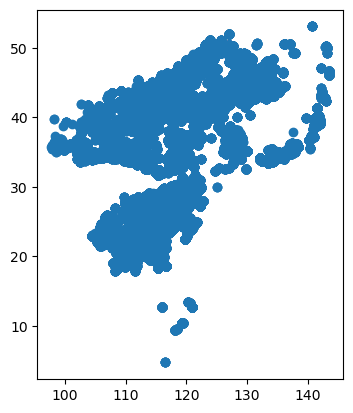

In [47]:
zircons['geometry']=gpd.points_from_xy(zircons['Longitude'],zircons['Latitude'])
zircons=zircons.set_crs("epsg:4326")
zircons.plot()

Directory already exists: /Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/Paleotopography/Figure/EastAsia/Topography


/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize


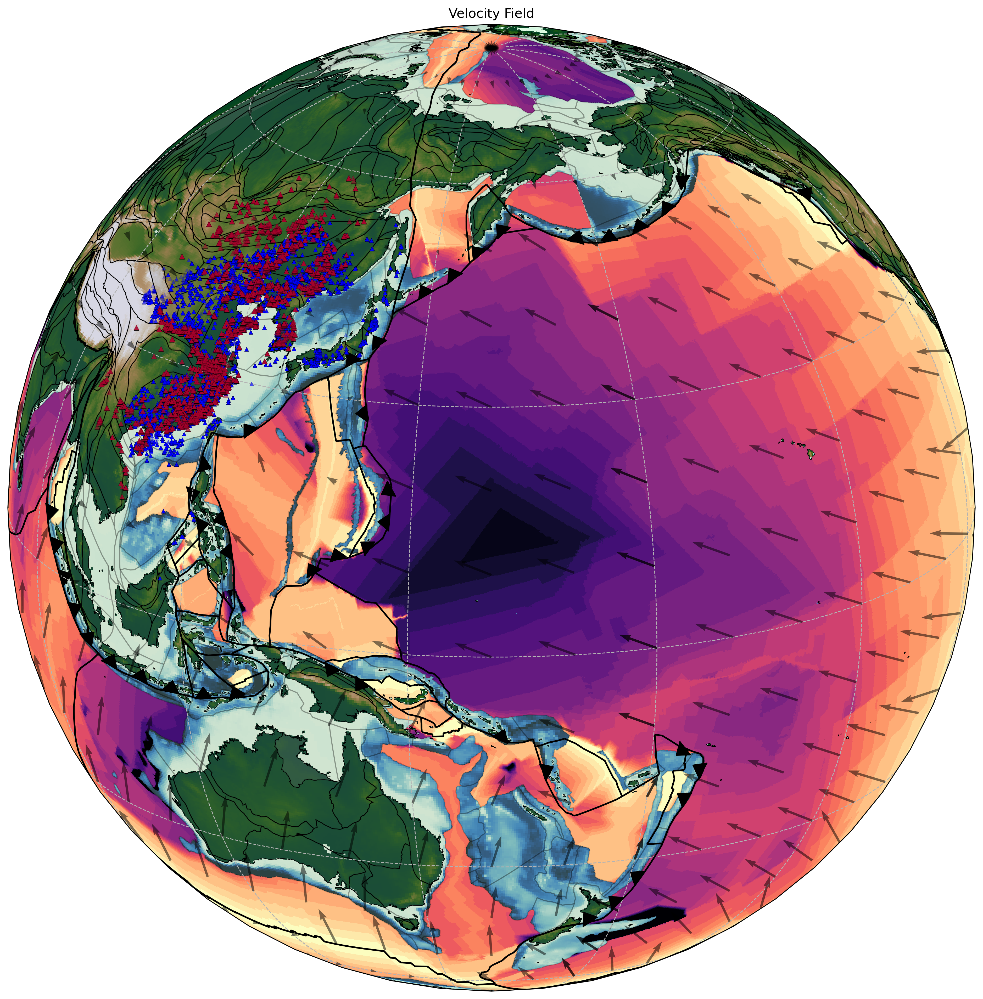

In [51]:
create_directory_if_not_exists(f"{DEFAULT_OUTPUT_FIG}/EastAsia/Topography")

fig = plt.figure(figsize=[24, 16], dpi=300)
reconstruction_time = 0  # Example reconstruction time
interval = 5  # Example interval for time steps
# Set projection to Orthographic
central_longitude = 160
central_latitude = 18
ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=central_latitude))
ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))

mollweide_proj = f"+proj=ortho +lon_0={central_longitude} +lat_0=0 +datum=WGS84 +units=m +no_defs"
gplot.time = reconstruction_time  # Ma
# gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)
# dl_topo_dir = f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Model_{WINDOW_SIZE}_MANTLE_interpolated"

# dl_topo = f"{dl_topo_dir}/{ml_model_name}_Model_{MODEL_NAME}_{reconstruction_time}.nc"

# raster_file1 = f"/Volumes/SatyamData/Paper3/NETCDF/DL_ModelFinal_Processed/DL_Model_{MODEL_NAME}_{reconstruction_time}.nc"
raster_file1 = f"/Volumes/SatyamData/Merdith1Ga/1Ga_Reconstructions/ETOPO/Smoothed Etopo.tif"
paleonetcdf = rioxarray.open_rasterio(raster_file1, masked=True)
paleonetcdf=paleonetcdf.coarsen(y=18, x=18, boundary='trim').mean()
# paleonetcdf.coarsen(y=180, x=360, boundary='trim')
raster_image = paleonetcdf.plot(
    ax=ax,
    # cmap=ETOPO,  # or your 'ETOPO' colormap
    cmap=cmc.bukavu,
    vmax=4500,
    vmin=-4500,
    transform=ccrs.PlateCarree(),  # input raster is in lat/lon
    # cbar_kwargs={
    #     'orientation': 'horizontal',
    #     'shrink': 0.5,  
    #     'label': 'ELEVATION (m)'
    # },
    add_colorbar=False  # Disable the default colorbar

)

raster_file2="/Volumes/SatyamData/Merdith1Ga/AgeGrid_1Ga_OptimisedMantleFrame_run48/masked/seafloor_age_mask_0Ma.nc"
paleonetcdf2 = xr.open_dataset(raster_file2)
paleonetcdf2 = paleonetcdf2['z']
paleonetcdf2.coarsen(lat=180, lon=360, boundary='trim')
raster_image2 = paleonetcdf2.plot(
    ax=ax,
    cmap=discrete_cmap,  # or your 'ETOPO' colormap
    vmax=200,
    vmin=0,
    transform=ccrs.PlateCarree(),
    add_colorbar=False)  # input raster is in lat/lon)


gplot.plot_continents(ax, facecolor='grey', alpha=0.2)
gplot.plot_coastlines(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)

gplot.plot_ridges(ax, color='k')
gplot.plot_transforms(ax, color='k')
gplot.plot_misc_boundaries(ax, color='k')
gplot.plot_trenches(ax, color='k')
gplot.plot_subduction_teeth(ax, color='k')

# ax.scatter(
#     zhou_joined['Lon'], zhou_joined['Lat'], 
#     s=5, c=zhou_joined['NAME'], alpha=0.5, transform=ccrs.PlateCarree(), zorder=3
# )

# Define a color map for categories
unique_names = zhou_joined['NAME'].unique()
symb =['^',"^","^","^","^"]   # Or 'Set2', 'Dark2', etc.
symbols = {name: symb[i] for i, name in enumerate(unique_names)}

# fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(8, 6))

# Loop through each category and plot separately
# for name in unique_names[:-1]:
#     subset = zhou_joined[zhou_joined['NAME'] == name]
#     ax.scatter(
#         subset['Lon'], subset['Lat'],
#         color="#A8042DDB",
#         s=25, marker=symbols[name], edgecolors="black",alpha=0.5,
#         linewidths=0.1,
#         label=name, transform=ccrs.PlateCarree(), zorder=3
#     )

# zhou_gdf.plot(ax=ax, color='red', markersize=5, alpha=0.5, zorder=3)

ax.scatter(zircons.geometry.x, zircons.geometry.y,
            color='blue', marker="^",
           s=15,edgecolors="black", 
           alpha=0.3, linewidths=0.1, zorder=3,transform=ccrs.PlateCarree())
ax.scatter(
         zhou_joined['Lon'], zhou_joined['Lat'],
         color="#A8042DDB",
         s=25, marker=symbols[name], edgecolors="black",alpha=0.3,
         linewidths=0.1,
         label=name, transform=ccrs.PlateCarree(), zorder=3
     )
# for name in unique_names[:-1]:
#     subset = zhou_joined[zhou_joined['NAME'] == name]
#     ax.scatter(
#         subset['Lon'], subset['Lat'],
#         color="#A8042DDB",
#         s=25, marker="*", edgecolors="black",alpha=0.,
#         linewidths=0.1,
#         label=name, transform=ccrs.PlateCarree(), zorder=3
#     )

# gplot.plot_plate_motion_vectors(ax, spacingX=10, spacingY=10,alpha=0.5, color='black', zorder=2)
q=gplot.plot_plate_motion_vectors(ax, spacingX=10, spacingY=10,alpha=0.5, color='black', zorder=2)

# Add a quiver key for 20 cm/yr
ax.quiverkey(q, X=0.9, Y=1.05, U=20,
             label='20 cm/yr', labelpos='E', coordinates='axes')
plt.savefig(f"{DEFAULT_OUTPUT_FIG}/EastAsia/Topography/ETOPO_OrthographicMain_{reconstruction_time}.png", dpi=300, bbox_inches='tight')
ax.set_aspect('equal')
plt.title('Velocity Field')
plt.show()

## Figure and Animation for East Asia

In [113]:
xr.open_dataset("/Volumes/SatyamData/Merdith1Ga/AgeGrid_1Ga_OptimisedMantleFrame_run48/masked/seafloor_age_mask_180Ma.nc")

<xarray.Dataset> Size: 26MB
Dimensions:  (lat: 1801, lon: 3601)
Coordinates:
  * lon      (lon) float64 29kB -180.0 -179.9 -179.8 ... 179.8 179.9 180.0
  * lat      (lat) float64 14kB -90.0 -89.9 -89.8 -89.7 ... 89.7 89.8 89.9 90.0
Data variables:
    z        (lat, lon) float32 26MB ...
Attributes:
    Conventions:  CF-1.7
    history:      sphinterpolate /tmp/tmp4irv9q0x -G../output/AgeGrids/unmask...
    GMT_version:  6.2.0 [64-bit]

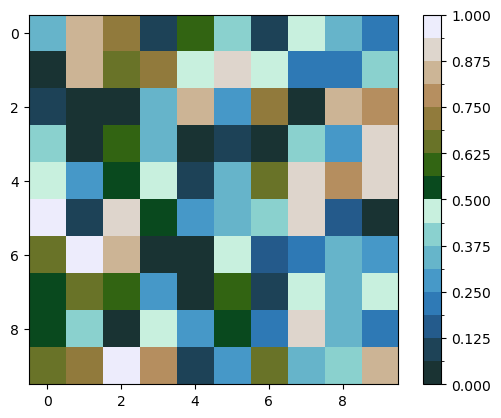

In [59]:
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import cmcrameri.cm as cmc

# Create some random data
data = np.random.rand(10, 10)

# Define the number of classes
num_classes = 16

# Choose a continuous colormap (e.g., 'viridis')
continuous_cmap = cmc.bukavu  # or any other colormap from cmcrameri

# Create a discrete colormap
discrete_cmap_topo = ListedColormap(continuous_cmap(np.linspace(0, 1, num_classes)))

# Define the boundaries for the classes
bounds = np.linspace(0, 1, num_classes + 1)
norm = BoundaryNorm(bounds, discrete_cmap_topo.N)

# Plot the image
plt.imshow(data, cmap=discrete_cmap_topo, norm=norm)
plt.colorbar()
plt.show()

In [ ]:
### Plot ETOPO on orthographic projection with coastlines and continents
for reconstruction_time in range(200, -1, -10):
# for reconstruction_time in [155]:
    fig = plt.figure(figsize=[24, 16], dpi=300)
    interval = 5  # Example interval for time steps
    # Set projection to Orthographic
    central_longitude = 134
    central_latitude = 37
    ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=central_latitude))
    ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))

    mollweide_proj = f"+proj=ortho +lon_0={central_longitude} +lat_0=0 +datum=WGS84 +units=m +no_defs"
    gplot.time = reconstruction_time  # Ma
    # gplot.plot_continents(ax, facecolor='palegoldenrod', alpha=0.2)



    raster_file2=f"/Volumes/SatyamData/Merdith1Ga/Merdith_etal_OPTIMISED_gplately2/seafloor_grid_output/SEAFLOOR_AGE/masked/Merdith_etal_2021_OPT_SEAFLOOR_AGE_grid_{reconstruction_time}Ma.nc"
    paleonetcdf2 = xr.open_dataset(raster_file2)
    paleonetcdf2 = paleonetcdf2['z']
    paleonetcdf2.coarsen(lat=180, lon=360, boundary='trim')
    paleonetcdf2 = paleonetcdf2.where(paleonetcdf2 <= 180)
    raster_image2 = paleonetcdf2.plot(
        ax=ax,
        cmap=discrete_cmap,  # or your 'ETOPO' colormap
        vmax=200,
        vmin=0,
        transform=ccrs.PlateCarree(),
        add_colorbar=False)  # input raster is in lat/lon)

    dl_topo_dir = f"{DEFAULT_OUTPUT_NetCDF}/{ml_model_name}_Model_{WINDOW_SIZE}_MANTLE_interpolated"

    raster_file1  = f"{dl_topo_dir}/{ml_model_name}_Model_{MODEL_NAME}_{reconstruction_time}.nc"

    # raster_file1 = f"/Volumes/SatyamData/Paper3/NETCDF/Mantle/PaleoDM/DL_Model_phase2_{reconstruction_time}.nc"
    # raster_file1 = f"/Volumes/SatyamData/Paper3/GPlatesProject/Rasters/PresentDayETopo/ETopo.tif"
    paleonetcdf=xr.open_dataarray(raster_file1)


    gplot.plot_continents(ax, facecolor='lightgrey', alpha=1.0)
    gplot.plot_coastlines(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)

    raster_image = paleonetcdf.plot(
        ax=ax,
        # cmap=ETOPO,  # or your 'ETOPO' colormap
        # vmax=8000,
        # vmin=-8000,
        # cmap=cmc.bukavu,  # or your 'ETOPO' colormap
        cmap=discrete_cmap_topo,
        vmax=4000,
        vmin=-4000,
        transform=ccrs.PlateCarree(),  # input raster is in lat/lon
        # cbar_kwargs={
        #     'orientation': 'horizontal',
        #     'shrink': 0.5,  
        #     'label': 'ELEVATION (m)'
        # },
        add_colorbar=False  # Disable the default colorbar

    )

    gplot.plot_ridges(ax, color='k')
    gplot.plot_transforms(ax, color='k')
    gplot.plot_trenches(ax, color='k')
    gplot.plot_subduction_teeth(ax,  spacing=0.03,color='k')


   


    gplot.plot_plate_motion_vectors(ax, spacingX=10, spacingY=10,alpha=0.5, color='black', zorder=2)
    
    # break
    plt.tight_layout()
    plt.savefig(f"{DEFAULT_OUTPUT_FIG}/EastAsia/Topography/Orthographic_{reconstruction_time}.png", dpi=300)
    # break
    plt.close()



/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize
/Users/ssin4735/miniforge3/envs/EBMTest311/lib/python3.11/site-packages/shapely/constructive.py:829: RuntimeWarning: invalid value encountered in normalize


### Let's plot from Zircon

In [ ]:
### Zircon Dataset
zrc_data1 = pd.read_excel("//Volumes/SatyamData/Paper4_HirnatianGlaciation/8303076/Database_v2.1_part1.xlsx",header=3)
zrc_data2= pd.read_excel("//Volumes/SatyamData/Paper4_HirnatianGlaciation/8303076/Database_v2.1_part2.xlsx",header=3)
zrc_data3= pd.read_excel("//Volumes/SatyamData/Paper4_HirnatianGlaciation/8303076/Database_v2.1_part3.xlsx",header=3)


In [ ]:
zrc_data=pd.concat([zrc_data1,zrc_data2,zrc_data3],ignore_index=True)

In [137]:
zrc_data["Age"] = zrc_data[['age206Pb/238U', 'age206Pb/238U_σ',
       'age207Pb/235U', 'age207Pb/235U_σ', 'age207Pb/206Pb']].mean(axis=1, skipna=True)

In [138]:
zrc_data_gdf= gpd.GeoDataFrame(zrc_data, geometry=gpd.points_from_xy(zrc_data['Longitude'], zrc_data['Latitude']))
zrc_data_gdf = zrc_data_gdf.set_crs("epsg:4326")

In [147]:
## filtering east asia zircons
east_asia_zrc = zrc_data_gdf[(zrc_data_gdf['Longitude'] >= 80) & (zrc_data_gdf['Longitude'] <= 160) &
                              (zrc_data_gdf['Latitude'] >= 0) & (zrc_data_gdf['Latitude'] <= 70)]
east_asia_zrc = east_asia_zrc[(east_asia_zrc['Age'] >= 0) & (east_asia_zrc['Age'] <= 200)]
east_asia_zrc = east_asia_zrc.dropna(subset=['Age'])

In [140]:
east_asia_zrc

,Ref_number,Data_number,Sample_number,isotope206Pb/238U,isotope206Pb/238U_σ,isotope207Pb/235U,isotope207Pb/235U_σ,isotope207Pb/206Pb,isotope207Pb/206Pb_σ,isotope208Pb/232Th,...,age207Pb/206Pb_σ,age208Pb/232Th,age208Pb/232Th_σ,Instrument,Reference_material,Lithology,Longitude,Latitude,Age,geometry
2489,REF-00094,2490,CDU59-1,0.002470,NaN,0.01688,NaN,0.049571,NaN,NaN,...,NaN,NaN,NaN,SHRIMP,NaN,igneous,101.8339,30.0839,41.59,POINT (101.8339 30.0839)
2490,REF-00094,2491,CDU59-2,0.002133,NaN,0.01387,NaN,0.047148,NaN,NaN,...,NaN,NaN,NaN,SHRIMP,NaN,igneous,101.8339,30.0839,17.04,POINT (101.8339 30.0839)
2491,REF-00094,2492,CDU59-3,0.002284,NaN,0.01504,NaN,0.047762,NaN,NaN,...,NaN,NaN,NaN,SHRIMP,NaN,igneous,101.8339,30.0839,23.62,POINT (101.8339 30.0839)
2492,REF-00094,2493,CDU59-4,0.001895,NaN,0.01240,NaN,0.047451,NaN,NaN,...,NaN,NaN,NaN,SHRIMP,NaN,igneous,101.8339,30.0839,19.40,POINT (101.8339 30.0839)
2493,REF-00094,2494,CDU59-5,0.002088,NaN,0.01334,NaN,0.046333,NaN,NaN,...,NaN,NaN,NaN,SHRIMP,NaN,igneous,101.8339,30.0839,8.48,POINT (101.8339 30.0839)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2027010,REF-11575,2027011,PM05/7RZ-11,0.032840,0.00085,0.26331,0.00877,0.058210,0.00203,0.00987,...,34.0,199.0,7.0,LA-ICP-MS,91500,igneous,87.2342,49.0597,199.00,POINT (87.2342 49.0597)
2027013,REF-11575,2027014,PM05/7RZ-14,0.031690,0.00086,0.22619,0.00870,0.051810,0.00211,0.00896,...,43.0,180.0,7.0,LA-ICP-MS,91500,igneous,87.2342,49.0597,139.40,POINT (87.2342 49.0597)
2027015,REF-11575,2027016,PM05/7RZ-16,0.030830,0.00087,0.23360,0.00947,0.055010,0.00239,0.00985,...,45.0,198.0,13.0,LA-ICP-MS,91500,igneous,87.2342,49.0597,167.00,POINT (87.2342 49.0597)
2027016,REF-11575,2027017,PM05/7RZ-17,0.030120,0.00089,0.21945,0.00980,0.052890,0.00254,0.00907,...,52.0,182.0,8.0,LA-ICP-MS,91500,igneous,87.2342,49.0597,146.00,POINT (87.2342 49.0597)


In [273]:
## reconstruction of east asia zircons through time
import gplately

paleolocs=[]
for reconstruction_time in range(200, -1, -1):
    try:
        print(f"Reconstructing East Asia Zircons for {reconstruction_time} Ma")
        pl = east_asia_zrc[(east_asia_zrc['Age'] > reconstruction_time-0.5) & (east_asia_zrc['Age'] < reconstruction_time + 0.5)].copy()

        gpts = gplately.Points(PK.model, pl['Longitude'],  pl['Latitude'], time=0)
        rlons, rlats = gpts.reconstruct(time=reconstruction_time, return_array=True)
        pl['Reconstructed Longitude'] = rlons
        pl['Reconstructed Latitude'] = rlats
        # Project to a suitable projected CRS (e.g., World Mercator EPSG:3395) before spatial join
        plgdf = gpd.GeoDataFrame(pl, geometry=gpd.points_from_xy(rlons, rlats), crs="epsg:4326")
        pk_asia = gpd.read_file(f"/Volumes/SatyamData/Paper3/DataforPaleotopography/PlateKinematics/PlateKinematics_{reconstruction_time}.gpkg")

        # Reproject both to a projected CRS
        projected_crs = "EPSG:3395"
        plgdf_proj = plgdf.to_crs(projected_crs)
        pk_asia_proj = pk_asia.to_crs(projected_crs)

        filtered_pl = gpd.sjoin_nearest(
            plgdf_proj, pk_asia_proj, how='left', max_distance=3000000,  # 500 km in meters
            distance_col="distance", lsuffix='left', rsuffix='right'
        )

        # Optionally, convert back to geographic CRS if needed
        filtered_pl = filtered_pl.to_crs("epsg:4326")
        filtered_pl = filtered_pl.drop(columns=['index_right'])
        pygplates.reconstruct("/Volumes/SatyamData/Paper3/EastAsianAndes/Subdomain.shp", PK.rotation_model, f"/Volumes/SatyamData/Paper3/ProfilesForAnimations/tmp.shp", reconstruction_time, anchor_plate_id=PK.anchor_plate_id)
        polygon = gpd.read_file(f"/Volumes/SatyamData/Paper3/ProfilesForAnimations/tmp.shp")
        polygon = polygon.to_crs("epsg:4326")
        
        filtered_pl = gpd.sjoin(filtered_pl, polygon, how='inner', predicate='within')
        filtered_pl = filtered_pl.dropna(subset=['geometry'])


        # pl['geometry'] = gpd.points_from_xy(rlons, rlats)
        paleolocs.append(filtered_pl)
    except Exception as e:
        print(f"Error reconstructing East Asia Zircons for {reconstruction_time} Ma: {e}")
        pass
    # break
paleolocs_gdf = pd.concat(paleolocs, ignore_index=True)


Reconstructing East Asia Zircons for 200 Ma
Reconstructing East Asia Zircons for 199 Ma
Reconstructing East Asia Zircons for 198 Ma
Reconstructing East Asia Zircons for 197 Ma
Reconstructing East Asia Zircons for 196 Ma
Reconstructing East Asia Zircons for 195 Ma
Reconstructing East Asia Zircons for 194 Ma
Reconstructing East Asia Zircons for 193 Ma
Reconstructing East Asia Zircons for 192 Ma
Reconstructing East Asia Zircons for 191 Ma
Reconstructing East Asia Zircons for 190 Ma
Reconstructing East Asia Zircons for 189 Ma
Reconstructing East Asia Zircons for 188 Ma
Reconstructing East Asia Zircons for 187 Ma
Reconstructing East Asia Zircons for 186 Ma
Reconstructing East Asia Zircons for 185 Ma
Reconstructing East Asia Zircons for 184 Ma
Reconstructing East Asia Zircons for 183 Ma
Reconstructing East Asia Zircons for 182 Ma
Reconstructing East Asia Zircons for 181 Ma
Reconstructing East Asia Zircons for 180 Ma
Reconstructing East Asia Zircons for 179 Ma
Reconstructing East Asia Zircons

In [ ]:
## reconstruction of east asia zircons through time
import gplately

paleolocs=[]
for reconstruction_time in range(200, -1, -1):
    try:
        print(f"Reconstructing East Asia Zircons for {reconstruction_time} Ma")
        pl = east_asia_zrc[(east_asia_zrc['Age'] > reconstruction_time-0.5) & (east_asia_zrc['Age'] < reconstruction_time + 0.5)].copy()

        gpts = gplately.Points(PK.model, pl['Longitude'],  pl['Latitude'], time=0)
        rlons, rlats = gpts.reconstruct(time=reconstruction_time, return_array=True)
        pl['Reconstructed Longitude'] = rlons
        pl['Reconstructed Latitude'] = rlats
        # Project to a suitable projected CRS (e.g., World Mercator EPSG:3395) before spatial join
        plgdf = gpd.GeoDataFrame(pl, geometry=gpd.points_from_xy(rlons, rlats), crs="epsg:4326")
        pk_asia = gpd.read_file(f"/Volumes/SatyamData/Paper3/DataforPaleotopography/PlateKinematics/PlateKinematics_{reconstruction_time}.gpkg")

        # Reproject both to a projected CRS
        projected_crs = "EPSG:3395"
        plgdf_proj = plgdf.to_crs(projected_crs)
        pk_asia_proj = pk_asia.to_crs(projected_crs)

        filtered_pl = gpd.sjoin_nearest(
            plgdf_proj, pk_asia_proj, how='left', max_distance=3000000,  # 500 km in meters
            distance_col="distance", lsuffix='left', rsuffix='right'
        )

        # Optionally, convert back to geographic CRS if needed
        filtered_pl = filtered_pl.to_crs("epsg:4326")
        # filtered_pl = filtered_pl.drop(columns=['index_right'])
        # pygplates.reconstruct("/Volumes/SatyamData/Paper3/EastAsianAndes/Subdomain.shp", PK.rotation_model, f"/Volumes/SatyamData/Paper3/ProfilesForAnimations/tmp.shp", reconstruction_time, anchor_plate_id=PK.anchor_plate_id)
        # polygon = gpd.read_file(f"/Volumes/SatyamData/Paper3/ProfilesForAnimations/tmp.shp")
        # polygon = polygon.to_crs("epsg:4326")
        
        # filtered_pl = gpd.sjoin(filtered_pl, polygon, how='inner', predicate='within')
        filtered_pl = filtered_pl.dropna(subset=['geometry'])


        # pl['geometry'] = gpd.points_from_xy(rlons, rlats)
        paleolocs.append(filtered_pl)
    except Exception as e:
        print(f"Error reconstructing East Asia Zircons for {reconstruction_time} Ma: {e}")
        pass
    # break
paleolocs_gdf = pd.concat(paleolocs, ignore_index=True)


In [190]:
paleolocs_gdf = pd.concat(paleolocs, ignore_index=True)

In [193]:
if "Time" in paleolocs_gdf.columns:
    paleolocs_gdf = paleolocs_gdf.drop(columns=["Time"])
# paleolocs_gdf

In [194]:
paleolocs_gdf.to_file("/Volumes/SatyamData/Paper3/EastAsianAndes/EastAsia_Zircons_Reconstructed.gpkg", driver='GPKG')

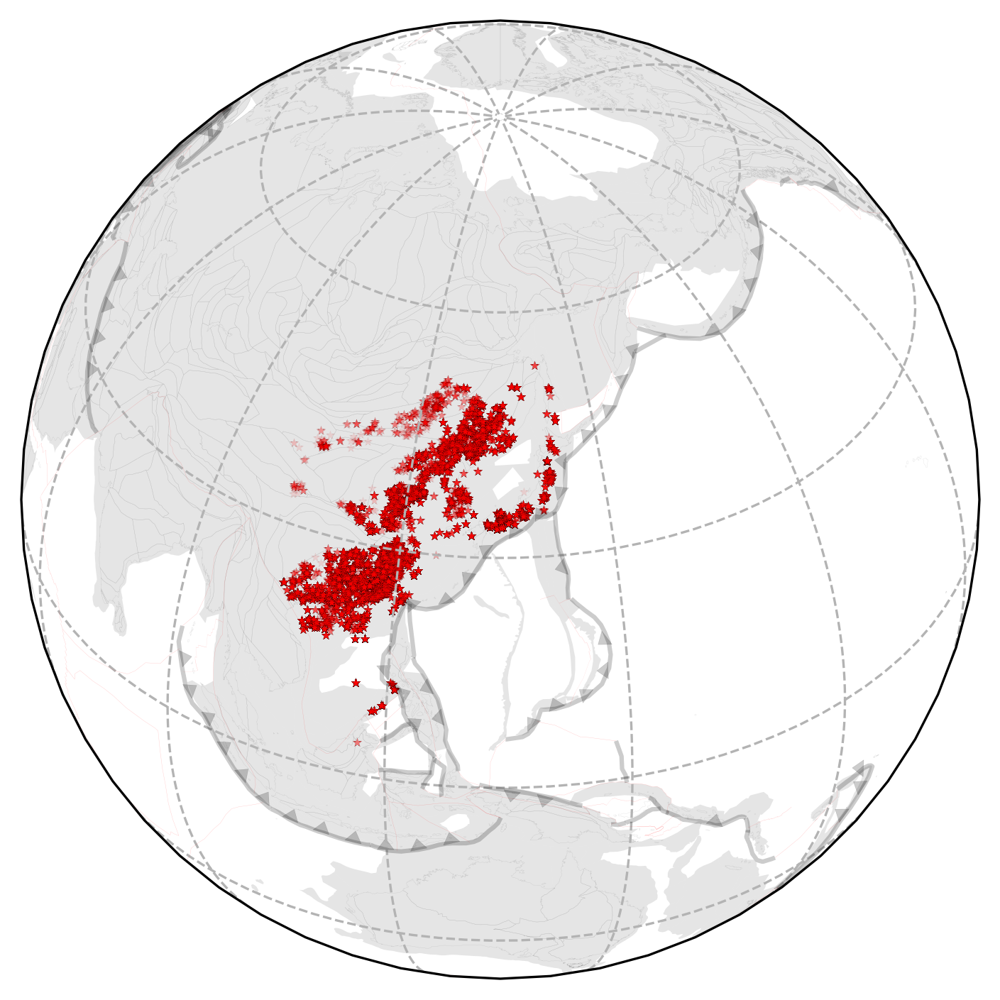

In [295]:
import cmcrameri as cmc
reconstruction_time=0
fig = plt.figure(dpi=300)
central_longitude = 134
central_latitude = 37

ax = fig.add_subplot(111, projection=ccrs.Orthographic(central_longitude=central_longitude, central_latitude=central_latitude))
ax.gridlines(color='0.7', linestyle='--', xlocs=np.arange(-180, 180, 30), ylocs=np.arange(-90, 90, 30))

gplot.time = reconstruction_time  # Ma



gplot.plot_continents(ax, facecolor='grey', alpha=0.2)
gplot.plot_coastlines(ax=ax, facecolor='none', edgecolor='black',alpha=0.1, linewidth=0.1)

gplot.plot_ridges(ax, color='r',alpha=0.2,linewidth=0.1)
gplot.plot_transforms(ax, color='r',alpha=0.1,linewidth=0.1)
gplot.plot_misc_boundaries(ax, color='r',alpha=0.2,linewidth=0.1)
gplot.plot_trenches(ax, color='k',alpha=0.2)
gplot.plot_subduction_teeth(ax, color='k',alpha=0.2,linewidth=0.1)



# paleolocs_gdf
# paleolocs_gdf = paleolocs_gdf.set_crs("epsg:4326")

# paleolocs_gdf = paleolocs_gdf[paleolocs_gdf['distance'] < 2000000]  # Filter points within 2000 km of East Asia
# if not paleolocs_gdf.empty:
#     sc = ax.scatter(
#         paleolocs_gdf["Longitude"],
#         paleolocs_gdf["Latitude"],
#         '*',
#         # c=paleolocs_gdf["Age"],
#         # cmap="magma",
#         # vmin=0,
#         # vmax=200,
#         # size=1,
#         edgecolor='black',
#         linewidth=0.1,
#         alpha=0.1,
#         transform=ccrs.PlateCarree(),
#     )

if not paleolocs_gdf.empty:
    sc = ax.scatter(
        paleolocs_gdf["Longitude"],
        paleolocs_gdf["Latitude"],
        marker='*',
        color="red",
        s=10,
        edgecolor='black',
        linewidth=0.04,
        alpha=0.1,
        transform=ccrs.PlateCarree(),
    )
# Add colorbar
# cbar = plt.colorbar(sc, ax=ax, orientation="horizontal", shrink=0.6, pad=0.05)
# cbar.set_label("Age (Ma)")
# polygon.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())
# ax.text(0.05, 0.95, f'Time: {reconstruction_time}–{reconstruction_time+interval} Ma', transform=ax.transAxes,
#         fontsize=6, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.1))
# ax.set_aspect('auto')
plt.tight_layout()
plt.savefig(f"/Volumes/SatyamData/Paper3/EastAsianAndes/Figures/ZirconProxies_Orthographic_{reconstruction_time}.png", dpi=300)

<Axes: >

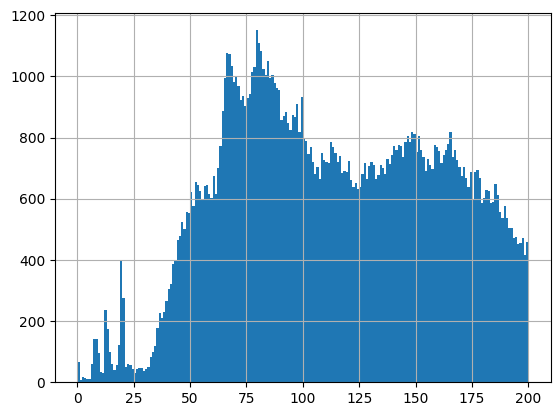

In [206]:
paleolocs_gdf['Age'].hist(bins=200)

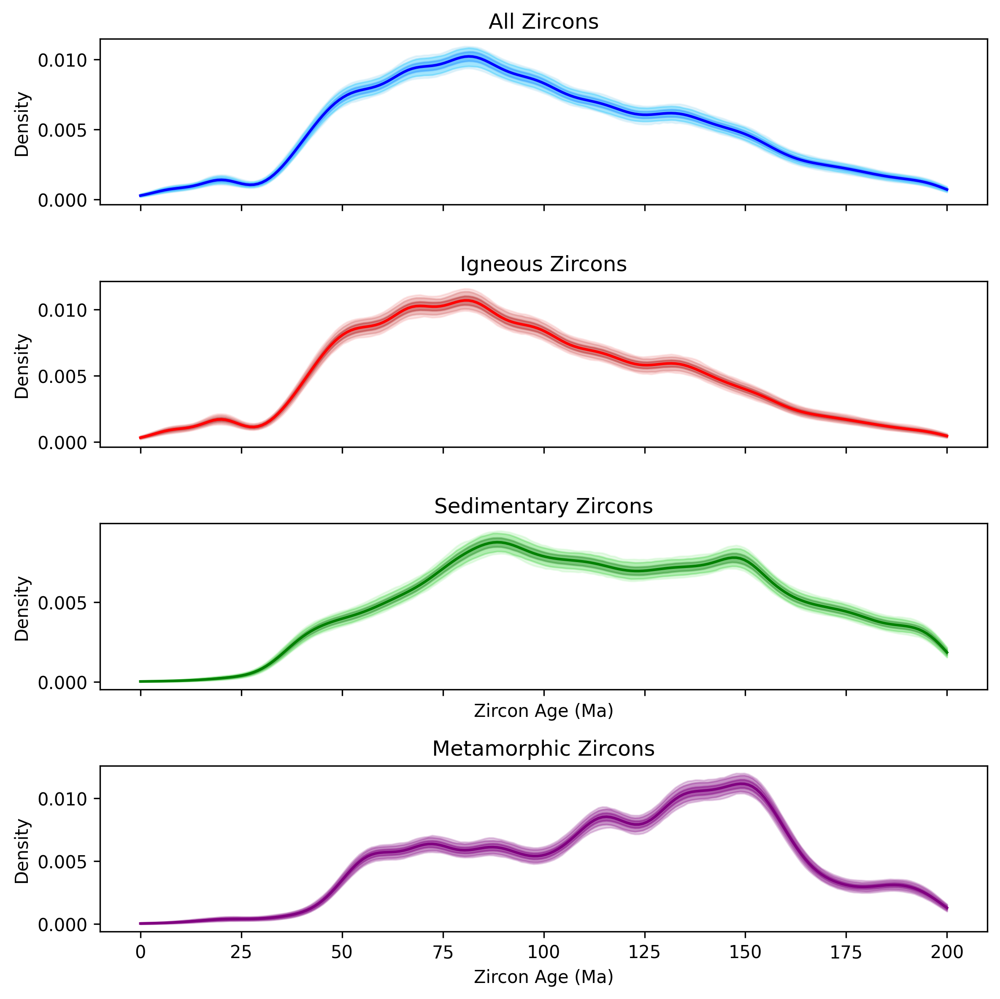

In [296]:
import numpy as np
import pandas as pd
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

# --- Sample zircon age data (replace with your real data) ---
# df = pd.DataFrame({'Age': [1200, 1210, 1220, 1300, 1350, 1400, 1450, 1500, 1550, 1600] * 10})

paleolocs_gdf_ig=paleolocs_gdf[paleolocs_gdf['Lithology'] == 'igneous'].copy()
# paleolocs_gdf_ig = paleolocs_gdf_ig[paleolocs_gdf_ig['distance'] <= 2000000]
paleolocs_gdf_sed=paleolocs_gdf[paleolocs_gdf['Lithology'] == 'sedimentary'].copy()
# paleolocs_gdf_sed = paleolocs_gdf_sed[paleolocs_gdf_sed['distance'] <= 2000000]

paleolocs_gdf_meta=paleolocs_gdf[paleolocs_gdf['Lithology'] == 'metamorphic'].copy()



sed_ig=pd.concat([paleolocs_gdf_ig,paleolocs_gdf_sed])
# paleolocs_gdf_ig = paleolocs_gdf_ig[paleolocs_gdf_ig['distance'] <= 2000000]  
ages = sed_ig['Age'].values
ages_ig = paleolocs_gdf_ig['Age'].values
ages_sed = paleolocs_gdf_sed['Age'].values
ages_meta=paleolocs_gdf_meta['Age'].values


def get_bootstrap_kde(ages, x_vals,n_bootstrap=1000, n_samples=5000, bw_method=0.12):
    """
    Generate bootstrap KDEs for the given ages.
    
    Parameters:
    - ages: array-like, zircon ages
    - x_vals: array-like, x-axis values for KDE
    - n_samples: int, number of bootstrap samples
    - bw_method: float, bandwidth for KDE
    
    Returns:
    - mean_density: array-like, mean density from bootstrapped KDEs
    - ci_68_low: array-like, lower bound of 68% confidence interval
    - ci_68_high: array-like, upper bound of 68% confidence interval
    """
    bootstrap_peaks = []
    for _ in range(n_bootstrap):
        sample = np.random.choice(ages, size=n_samples, replace=True)
        kde = gaussian_kde(sample, bw_method=bw_method)
        bootstrap_peaks.append(kde(x_vals))
    
    bootstrap_peaks = np.array(bootstrap_peaks)
    
    mean_density = np.mean(bootstrap_peaks, axis=0)
    ci_68_low = np.percentile(bootstrap_peaks, 16, axis=0)
    ci_68_high = np.percentile(bootstrap_peaks, 84, axis=0)

    ci_95_low = np.percentile(bootstrap_peaks, 2.5, axis=0)
    ci_95_high = np.percentile(bootstrap_peaks, 97.5, axis=0)

    ci_99_low = np.percentile(bootstrap_peaks, 0.5, axis=0)
    ci_99_high = np.percentile(bootstrap_peaks, 99.5, axis=0)
    
    return mean_density, ci_68_low, ci_68_high, ci_95_low, ci_95_high, ci_99_low, ci_99_high
# --- KDE X-Axis Range ---
x_vals = np.linspace(0, 200, 200)

# --- Get bootstrap KDE and confidence intervals ---
mean_density, ci_68_low, ci_68_high, ci_95_low, ci_95_high, ci_99_low, ci_99_high = get_bootstrap_kde(ages, x_vals)
mean_density_ig, ci_68_low_ig, ci_68_high_ig, ci_95_low_ig, ci_95_high_ig, ci_99_low_ig, ci_99_high_ig = get_bootstrap_kde(ages_ig, x_vals)
mean_density_sed, ci_68_low_sed, ci_68_high_sed, ci_95_low_sed, ci_95_high_sed, ci_99_low_sed, ci_99_high_sed = get_bootstrap_kde(ages_sed, x_vals)
mean_density_meta, ci_68_low_meta, ci_68_high_meta, ci_95_low_meta, ci_95_high_meta, ci_99_low_meta, ci_99_high_meta = get_bootstrap_kde(ages_meta, x_vals)



# --- Plotting Libraries ---
import matplotlib.pyplot as plt
import matplotlib.cm as cmc
# --- Set up the plot ---
# plt.style.use('seaborn-darkgrid')  # Use a dark grid style for better visibility
# --- Plotting the KDEs with confidence intervals in three subplots ---
fig, axs = plt.subplots(4, 1, figsize=(8, 8), sharex=True,dpi=300)

# All zircons
axs[0].fill_between(x_vals, ci_99_low, ci_99_high, color='skyblue', alpha=0.2, label='99% CI')
axs[0].fill_between(x_vals, ci_95_low, ci_95_high, color='deepskyblue', alpha=0.3, label='95% CI')
axs[0].fill_between(x_vals, ci_68_low, ci_68_high, color='dodgerblue', alpha=0.4, label='68% CI')
axs[0].plot(x_vals, mean_density, color='blue', label='Mean KDE')
axs[0].set_ylabel('Density')
axs[0].set_title('All Zircons')
# axs[0].legend()

# Igneous zircons
axs[1].fill_between(x_vals, ci_99_low_ig, ci_99_high_ig, color='lightcoral', alpha=0.2, label='99% CI')
axs[1].fill_between(x_vals, ci_95_low_ig, ci_95_high_ig, color='indianred', alpha=0.3, label='95% CI')
axs[1].fill_between(x_vals, ci_68_low_ig, ci_68_high_ig, color='firebrick', alpha=0.4, label='68% CI')
axs[1].plot(x_vals, mean_density_ig, color='red', label='Mean KDE')
axs[1].set_ylabel('Density')
axs[1].set_title('Igneous Zircons')
# axs[1].legend()

# Sedimentary zircons
axs[2].fill_between(x_vals, ci_99_low_sed, ci_99_high_sed, color='lightgreen', alpha=0.2, label='99% CI')
axs[2].fill_between(x_vals, ci_95_low_sed, ci_95_high_sed, color='limegreen', alpha=0.3, label='95% CI')
axs[2].fill_between(x_vals, ci_68_low_sed, ci_68_high_sed, color='forestgreen', alpha=0.4, label='68% CI')
axs[2].plot(x_vals, mean_density_sed, color='green', label='Mean KDE')
axs[2].set_xlabel('Zircon Age (Ma)')
axs[2].set_ylabel('Density')
axs[2].set_title('Sedimentary Zircons')
# axs[2].legend()

# Meta
axs[3].fill_between(x_vals, ci_99_low_meta, ci_99_high_meta, color='purple', alpha=0.2, label='99% CI')
axs[3].fill_between(x_vals, ci_95_low_meta, ci_95_high_meta, color='purple', alpha=0.3, label='95% CI')
axs[3].fill_between(x_vals, ci_68_low_meta, ci_68_high_meta, color='purple', alpha=0.4, label='68% CI')
axs[3].plot(x_vals, mean_density_meta, color='purple', label='Mean KDE')
axs[3].set_xlabel('Zircon Age (Ma)')
axs[3].set_ylabel('Density')
axs[3].set_title('Metamorphic Zircons')

plt.tight_layout()
# plt.show()

# Save the figure
plt.savefig("/Volumes/SatyamData/Paper3/EastAsianAndes/Figures/ZirconProxies_KDE.png", dpi=300)
